<a href="https://colab.research.google.com/github/Sadhana1842/DR-and-CKD/blob/main/Diabetic_retinography.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


-------------------------------------------------------------------------------------------------------------------------------------------

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage.feature import greycomatrix, greycoprops
from skimage import io,color,img_as_ubyte


def equ(name):
  # Load the image
  image = cv2.imread(name, cv2.IMREAD_GRAYSCALE)

  # Apply histogram equalization
  equalized_image = cv2.equalizeHist(image)

  # Display the original and equalized images using matplotlib
  plt.subplot(1, 2, 1)
  plt.imshow(image, cmap='gray')
  plt.title('Original Image')

  plt.subplot(1, 2, 2)
  plt.imshow(equalized_image, cmap='gray')
  plt.title('Equalized Image')

  plt.show()
  return equalized_image



def matrix(equalized_image):
  # Load the image
  #image = io.imread('/content/Moderate_DR_89.png')


  # Convert the image to grayscale

  gray_image = img_as_ubyte(equalized_image)

  # Specify distances and angles for GLCM computation
  distances = [1]  # You can use different distances
  angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]  # You can use different angles

  # Compute the GLCM
  glcm = greycomatrix(gray_image, distances=distances, angles=angles, symmetric=True, normed=True)

  # Compute GLCM properties (features)
  contrast = greycoprops(glcm, 'contrast')
  dissimilarity = greycoprops(glcm, 'dissimilarity')
  homogeneity = greycoprops(glcm, 'homogeneity')
  energy = greycoprops(glcm, 'energy')
  correlation = greycoprops(glcm, 'correlation')
  ASM = greycoprops(glcm, 'ASM')

  # Print the computed features
  print("Gray-Level Co-Occurrence Matrix:")
  print(glcm)

  normalized_contrast=[]
  normalized_dissimilarity=[]
  normalized_homogeneity=[]
  normalized_energy=[]
  normalized_correlation=[]
  normalized_ASM=[]

  for i in range(0,4):
    min_contrast = np.min(contrast)
    max_contrast = np.max(contrast)
    norm_contrast = (contrast[0][i] - min_contrast) / (max_contrast - min_contrast)
    normalized_contrast.append(norm_contrast)



  for i in range(0,4):
    min_contrast = np.min(dissimilarity)
    max_contrast = np.max(dissimilarity)
    norm_dissimilarity = (dissimilarity[0][i] - min_contrast) / (max_contrast - min_contrast)
    normalized_dissimilarity.append(norm_dissimilarity)


  for i in range(0,4):
    min_contrast = np.min(homogeneity)
    max_contrast = np.max(homogeneity)
    norm_homo = (homogeneity[0][i] - min_contrast) / (max_contrast - min_contrast)
    normalized_homogeneity.append(norm_homo)

  for i in range(0,4):
    min_contrast = np.min(energy)
    max_contrast = np.max(energy)
    norm_ene = (energy[0][i] - min_contrast) / (max_contrast - min_contrast)
    normalized_energy.append(norm_ene)

  for i in range(0,4):
    min_contrast = np.min(correlation)
    max_contrast = np.max(correlation)
    norm_cor = (correlation[0][i] - min_contrast) / (max_contrast - min_contrast)
    normalized_correlation.append(norm_cor)

  for i in range(0,4):
    min_contrast = np.min(ASM)
    max_contrast = np.max(ASM)
    norm_asm = (ASM[0][i] - min_contrast) / (max_contrast - min_contrast)
    normalized_ASM.append(norm_asm)




  print("Contrast:", normalized_contrast)
  print("Dissimilarity:", normalized_dissimilarity)
  print("Homogeneity:", normalized_homogeneity)
  print("Energy:", normalized_energy)
  print("Correlation:", normalized_correlation)
  print("ASM:", normalized_ASM)
  return glcm


def scatter(glcm):
  flattened_glcm = glcm[:, :, 0, 0].flatten()

  # Create a scatter-like plot
  plt.scatter(range(flattened_glcm.size), flattened_glcm, s=1, c=flattened_glcm, cmap='hot')
  plt.title('Scatter-Like Plot for GLCM')
  plt.xlabel('Position in Flattened GLCM')
  plt.ylabel('GLCM Value')
  plt.colorbar(label='GLCM Value')
  plt.show()

def heatmap(glcm):
  plt.imshow(glcm[:, :, 0, 0], cmap='hot', interpolation='nearest')
  plt.title('GLCM Heatmap')
  plt.colorbar()
  plt.show()



HEALTHY DR

Processing: Healthy_15.png


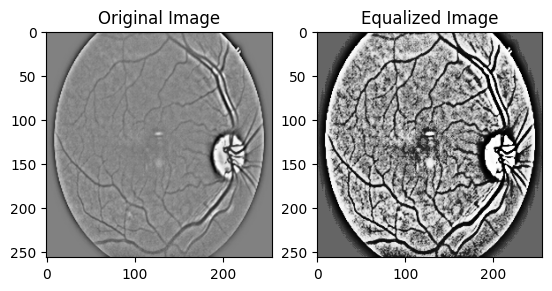

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[6.43382353e-04 8.30449827e-04 1.07230392e-03 5.22875817e-04]]

  [[6.20404412e-04 5.99769319e-04 5.59129902e-04 4.99807766e-04]]

  [[1.91482843e-04 1.15340254e-04 7.65931373e-05 1.92233756e-04]]

  ...

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 1.53787005e-05]]

  [[7.65931373e-06 1.53787005e-05 0.00000000e+00 2.30680507e-05]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 3.84467512e-05]]]


 [[[6.20404412e-04 5.99769319e-04 5.59129902e-04 4.99807766e-04]]

  [[6.89338235e-04 6.61284121e-04 1.30208333e-03 6.61284121e-04]]

  [[5.28492647e-04 5.53633218e-04 7.35294118e-04 4.69050365e-04]]

  ...

  [[0.00000000e+00 0.00000000e+00 7.65931373e-06 1.53787005e-05]]

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 3.84467512e-05]]]


 [[[1.91482843e-04 1.15340254e-04 7.65931373e-05 1.92233756e-04]]

  [[5.28492647e-04 5.53633218e-04 7.35294118e-04 4.69050365e-04]]

  [[6.58700

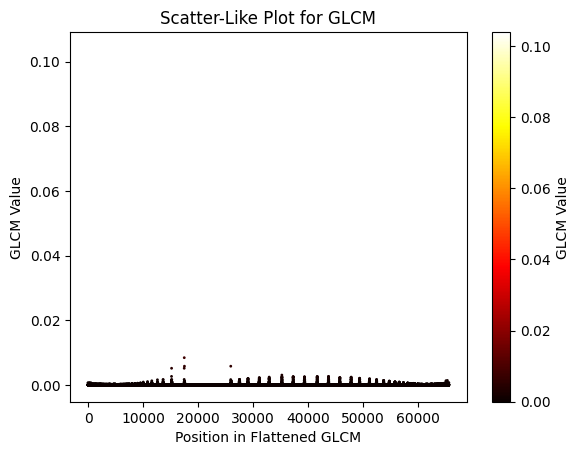

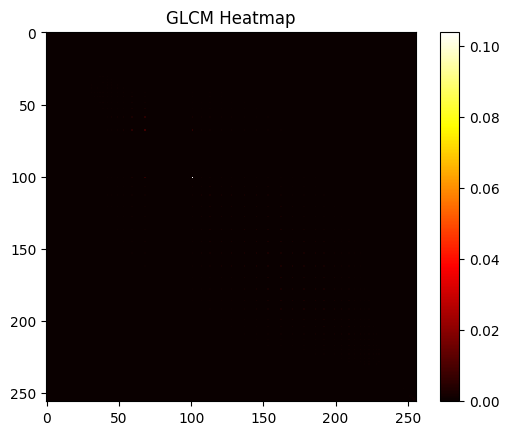

Processing: Healthy_11.png


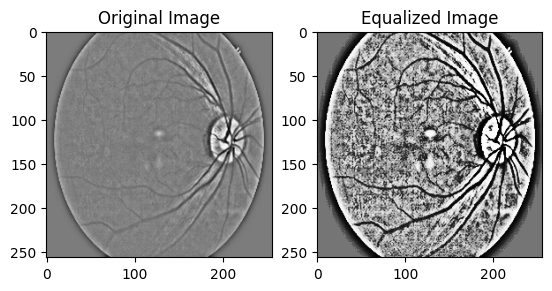

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[5.82107843e-04 5.07497116e-04 9.95710784e-04 6.45905421e-04]]

  [[3.59987745e-04 3.38331411e-04 3.75306373e-04 2.92195309e-04]]

  [[2.14460784e-04 1.53787005e-04 1.14889706e-04 9.99615532e-05]]

  ...

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 1.53787005e-05]]

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]]


 [[[3.59987745e-04 3.38331411e-04 3.75306373e-04 2.92195309e-04]]

  [[5.66789216e-04 6.45905421e-04 1.16421569e-03 5.53633218e-04]]

  [[3.67647059e-04 4.38292964e-04 7.12316176e-04 3.53710111e-04]]

  ...

  [[7.65931373e-06 1.53787005e-05 0.00000000e+00 6.15148020e-05]]

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 1.53787005e-05]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 0.00000000e+00]]]


 [[[2.14460784e-04 1.53787005e-04 1.14889706e-04 9.99615532e-05]]

  [[3.67647059e-04 4.38292964e-04 7.12316176e-04 3.53710111e-04]]

  [[4.13602

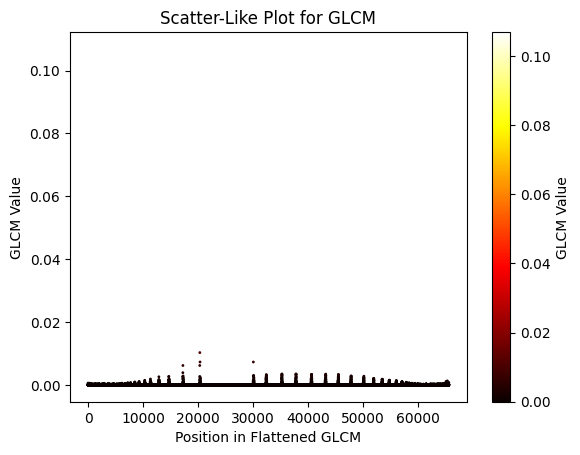

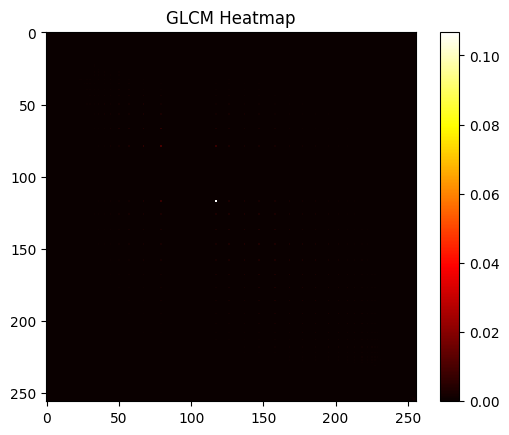

Processing: Healthy_210.png


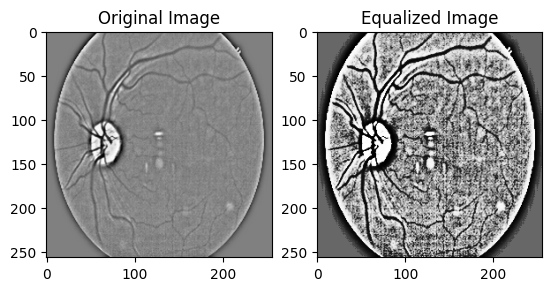

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[7.65931373e-04 5.07497116e-04 9.49754902e-04 8.76585928e-04]]

  [[5.13174020e-04 4.76739715e-04 5.36151961e-04 5.22875817e-04]]

  [[1.68504902e-04 1.92233756e-04 8.42524510e-05 5.38254517e-05]]

  ...

  [[0.00000000e+00 3.07574010e-05 0.00000000e+00 2.30680507e-05]]

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 7.68935025e-06]]

  [[0.00000000e+00 5.38254517e-05 0.00000000e+00 0.00000000e+00]]]


 [[[5.13174020e-04 4.76739715e-04 5.36151961e-04 5.22875817e-04]]

  [[1.05698529e-03 7.84313725e-04 1.51654412e-03 1.12264514e-03]]

  [[4.74877451e-04 3.99846213e-04 6.28063725e-04 3.99846213e-04]]

  ...

  [[0.00000000e+00 6.92041522e-05 0.00000000e+00 6.15148020e-05]]

  [[0.00000000e+00 3.84467512e-05 0.00000000e+00 2.30680507e-05]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 7.68935025e-06]]]


 [[[1.68504902e-04 1.92233756e-04 8.42524510e-05 5.38254517e-05]]

  [[4.74877451e-04 3.99846213e-04 6.28063725e-04 3.99846213e-04]]

  [[2.45098

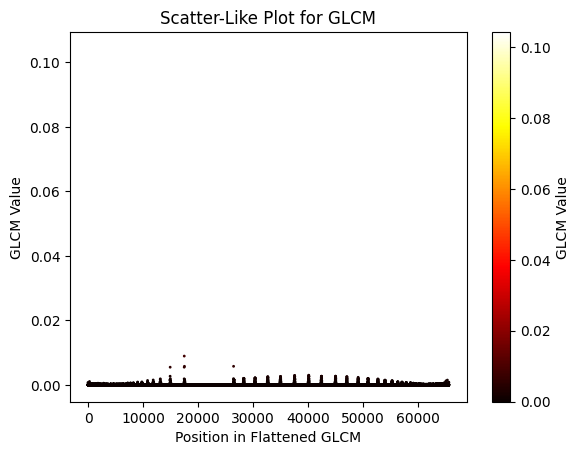

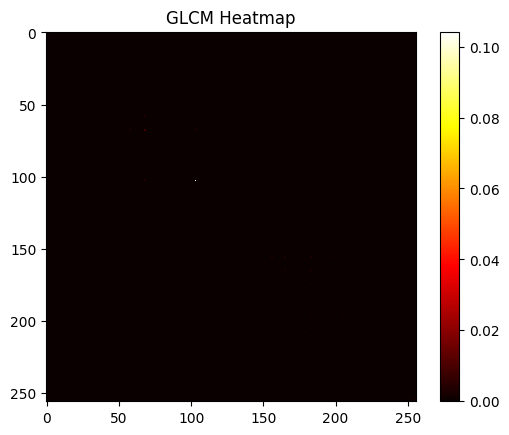

Processing: Healthy_102.png


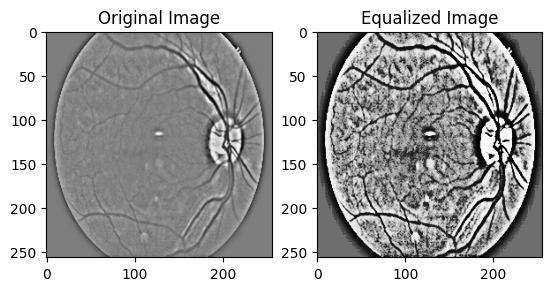

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[5.51470588e-04 1.13802384e-03 9.19117647e-04 2.15301807e-04]]

  [[6.51041667e-04 4.76739715e-04 6.66360294e-04 3.53710111e-04]]

  [[1.99142157e-04 9.22722030e-05 1.14889706e-04 1.84544406e-04]]

  ...

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]

  [[7.65931373e-06 1.53787005e-05 0.00000000e+00 3.84467512e-05]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 2.30680507e-05]]]


 [[[6.51041667e-04 4.76739715e-04 6.66360294e-04 3.53710111e-04]]

  [[7.19975490e-04 1.59938485e-03 1.33272059e-03 5.99769319e-04]]

  [[4.21262255e-04 6.45905421e-04 6.28063725e-04 2.84505959e-04]]

  ...

  [[0.00000000e+00 0.00000000e+00 7.65931373e-06 2.30680507e-05]]

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 7.68935025e-06]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 4.61361015e-05]]]


 [[[1.99142157e-04 9.22722030e-05 1.14889706e-04 1.84544406e-04]]

  [[4.21262255e-04 6.45905421e-04 6.28063725e-04 2.84505959e-04]]

  [[5.51470

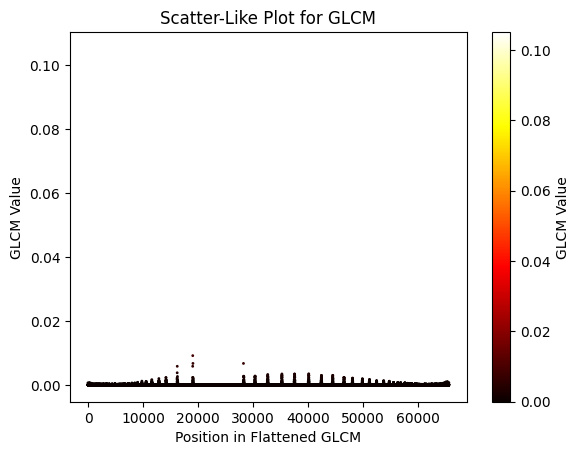

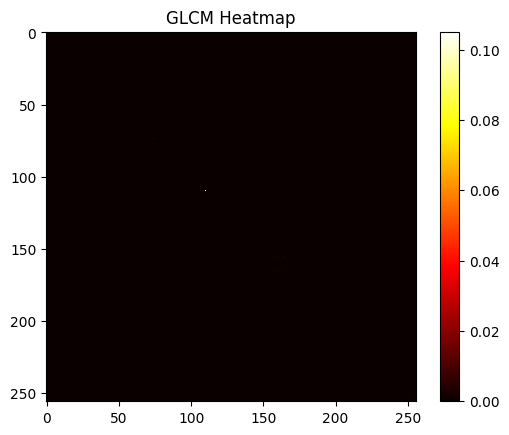

Processing: Healthy_23.png


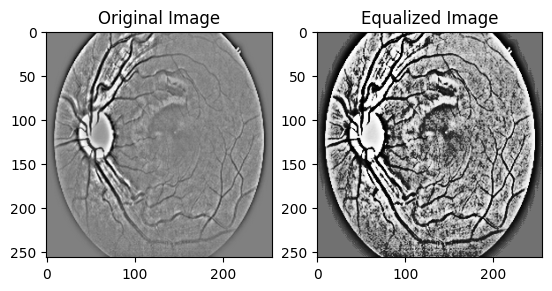

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[4.59558824e-04 2.46059208e-04 8.27205882e-04 8.91964629e-04]]

  [[3.52328431e-04 2.53748558e-04 5.28492647e-04 4.30603614e-04]]

  [[2.60416667e-04 1.61476355e-04 2.60416667e-04 2.46059208e-04]]

  ...

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 7.68935025e-06]]]


 [[[3.52328431e-04 2.53748558e-04 5.28492647e-04 4.30603614e-04]]

  [[7.96568627e-04 1.04575163e-03 1.39399510e-03 8.15071126e-04]]

  [[6.20404412e-04 4.76739715e-04 6.89338235e-04 6.22837370e-04]]

  ...

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 7.68935025e-06]]

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 7.68935025e-06]]

  [[0.00000000e+00 3.84467512e-05 0.00000000e+00 2.30680507e-05]]]


 [[[2.60416667e-04 1.61476355e-04 2.60416667e-04 2.46059208e-04]]

  [[6.20404412e-04 4.76739715e-04 6.89338235e-04 6.22837370e-04]]

  [[4.74877

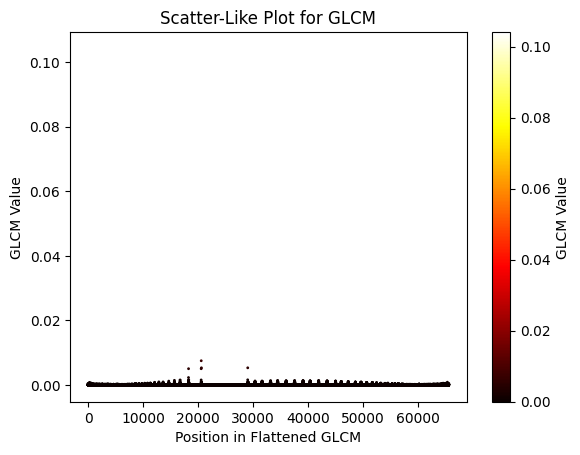

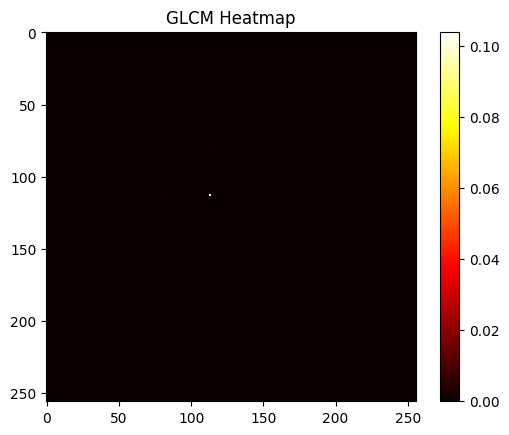

Processing: Healthy_29.png


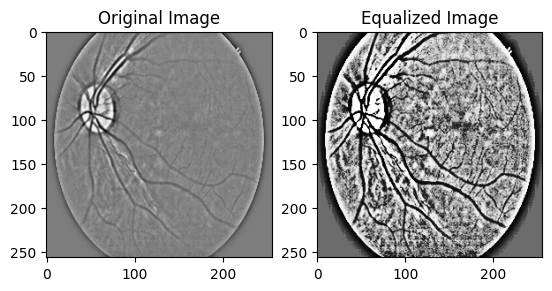

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[6.58700980e-04 5.22875817e-04 9.03799020e-04 7.07420223e-04]]

  [[4.44240196e-04 2.92195309e-04 4.67218137e-04 3.99846213e-04]]

  [[2.52757353e-04 1.61476355e-04 1.76164216e-04 1.46097655e-04]]

  ...

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 3.07574010e-05]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]]


 [[[4.44240196e-04 2.92195309e-04 4.67218137e-04 3.99846213e-04]]

  [[8.73161765e-04 6.30526720e-04 1.28676471e-03 1.21491734e-03]]

  [[5.20833333e-04 4.84429066e-04 6.96997549e-04 5.15186467e-04]]

  ...

  [[0.00000000e+00 9.22722030e-05 0.00000000e+00 5.38254517e-05]]

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 2.30680507e-05]]

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 7.68935025e-06]]]


 [[[2.52757353e-04 1.61476355e-04 1.76164216e-04 1.46097655e-04]]

  [[5.20833333e-04 4.84429066e-04 6.96997549e-04 5.15186467e-04]]

  [[3.67647

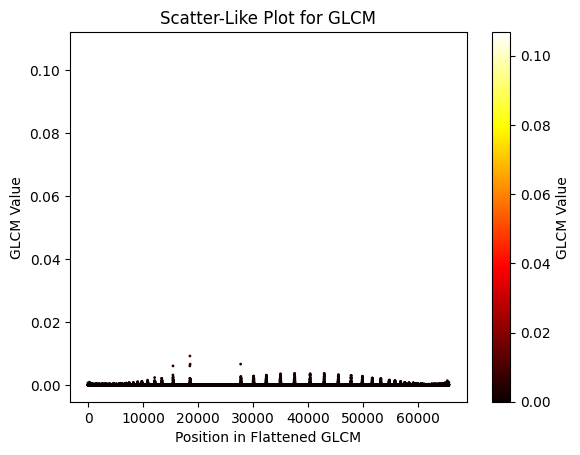

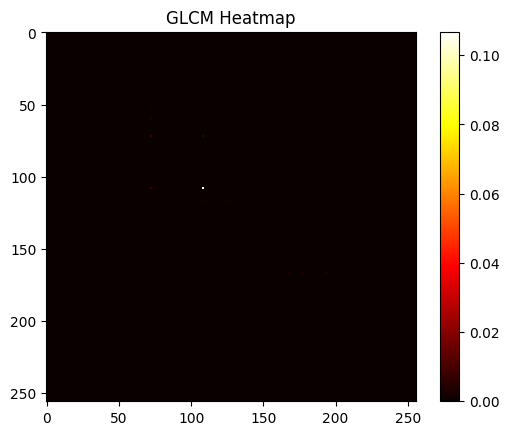

Processing: Healthy_227.png


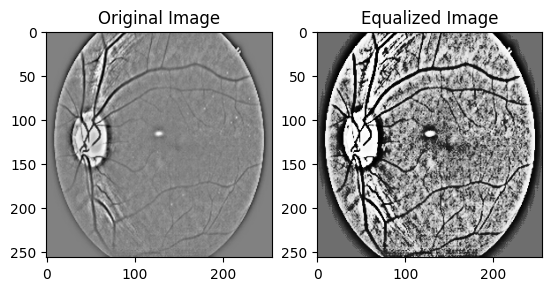

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[3.21691176e-04 1.84544406e-04 1.05698529e-03 5.99769319e-04]]

  [[4.44240196e-04 2.76816609e-04 4.90196078e-04 5.15186467e-04]]

  [[1.53186275e-04 1.46097655e-04 9.19117647e-05 1.38408304e-04]]

  ...

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 0.00000000e+00]]]


 [[[4.44240196e-04 2.76816609e-04 4.90196078e-04 5.15186467e-04]]

  [[8.42524510e-04 6.30526720e-04 1.36335784e-03 1.32256824e-03]]

  [[5.36151961e-04 3.07574010e-04 7.19975490e-04 3.92156863e-04]]

  ...

  [[7.65931373e-06 3.84467512e-05 0.00000000e+00 1.53787005e-05]]

  [[0.00000000e+00 3.84467512e-05 0.00000000e+00 2.30680507e-05]]

  [[0.00000000e+00 3.07574010e-05 0.00000000e+00 0.00000000e+00]]]


 [[[1.53186275e-04 1.46097655e-04 9.19117647e-05 1.38408304e-04]]

  [[5.36151961e-04 3.07574010e-04 7.19975490e-04 3.92156863e-04]]

  [[4.44240

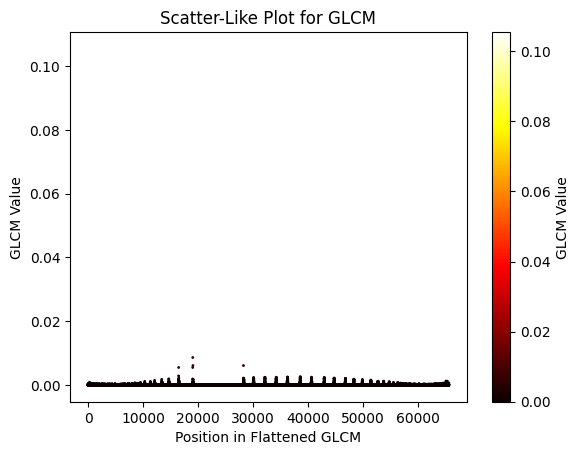

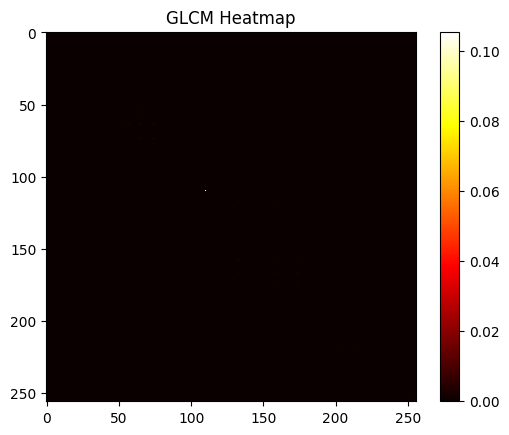

Processing: Healthy_589.png


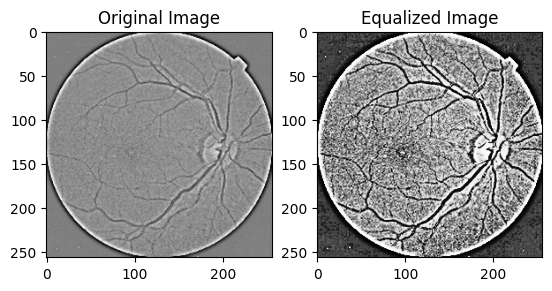

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[5.97426471e-04 9.22722030e-05 3.67647059e-04 1.38408304e-04]]

  [[1.83823529e-04 1.92233756e-04 2.60416667e-04 1.30718954e-04]]

  [[2.52757353e-04 2.07612457e-04 1.91482843e-04 1.84544406e-04]]

  ...

  [[3.06372549e-05 3.84467512e-05 0.00000000e+00 6.15148020e-05]]

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 3.84467512e-05]]

  [[0.00000000e+00 3.07574010e-05 0.00000000e+00 0.00000000e+00]]]


 [[[1.83823529e-04 1.92233756e-04 2.60416667e-04 1.30718954e-04]]

  [[5.66789216e-04 3.07574010e-04 8.57843137e-04 2.92195309e-04]]

  [[4.67218137e-04 4.15224913e-04 5.97426471e-04 3.99846213e-04]]

  ...

  [[1.53186275e-05 8.45828527e-05 7.65931373e-06 3.84467512e-05]]

  [[1.53186275e-05 6.15148020e-05 0.00000000e+00 4.61361015e-05]]

  [[7.65931373e-06 6.92041522e-05 0.00000000e+00 9.22722030e-05]]]


 [[[2.52757353e-04 2.07612457e-04 1.91482843e-04 1.84544406e-04]]

  [[4.67218137e-04 4.15224913e-04 5.97426471e-04 3.99846213e-04]]

  [[7.35294

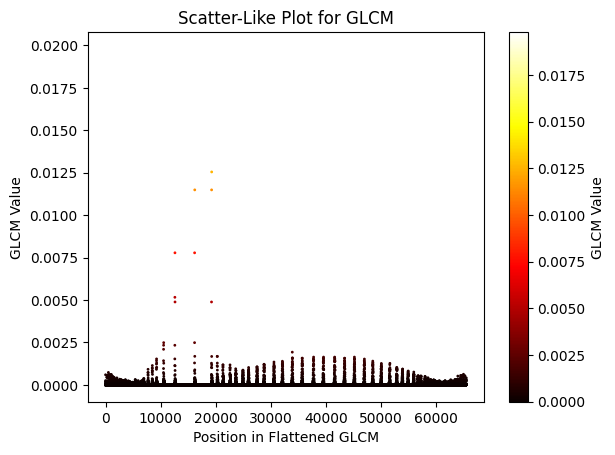

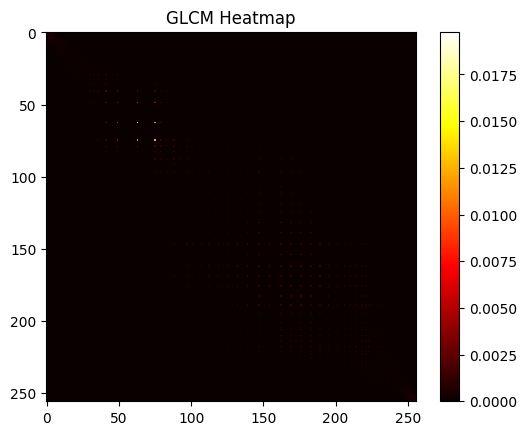

Processing: Healthy_558.png


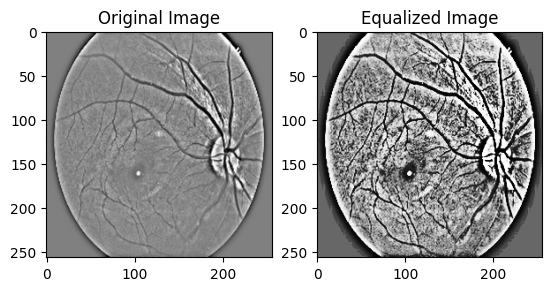

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[6.43382353e-04 1.04575163e-03 8.88480392e-04 4.92118416e-04]]

  [[5.89767157e-04 5.22875817e-04 6.20404412e-04 3.53710111e-04]]

  [[1.68504902e-04 1.53787005e-04 2.14460784e-04 1.84544406e-04]]

  ...

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 2.30680507e-05]]

  [[7.65931373e-06 2.30680507e-05 0.00000000e+00 3.07574010e-05]]

  [[0.00000000e+00 3.07574010e-05 0.00000000e+00 6.92041522e-05]]]


 [[[5.89767157e-04 5.22875817e-04 6.20404412e-04 3.53710111e-04]]

  [[8.57843137e-04 1.36870434e-03 1.24080882e-03 5.84390619e-04]]

  [[5.51470588e-04 6.15148020e-04 7.88909314e-04 3.69088812e-04]]

  ...

  [[7.65931373e-06 0.00000000e+00 0.00000000e+00 4.61361015e-05]]

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 1.53787005e-05]]

  [[0.00000000e+00 3.07574010e-05 0.00000000e+00 3.07574010e-05]]]


 [[[1.68504902e-04 1.53787005e-04 2.14460784e-04 1.84544406e-04]]

  [[5.51470588e-04 6.15148020e-04 7.88909314e-04 3.69088812e-04]]

  [[6.58700

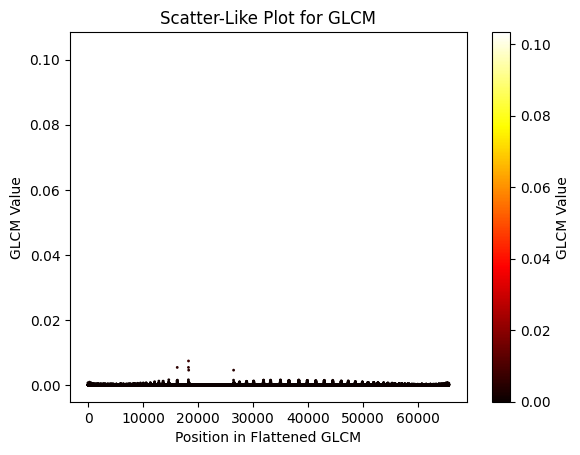

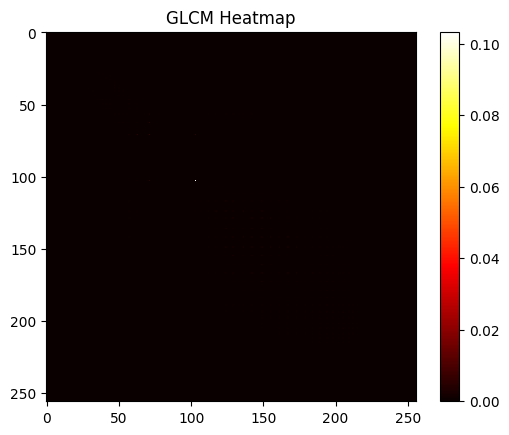

Processing: Healthy_643.png


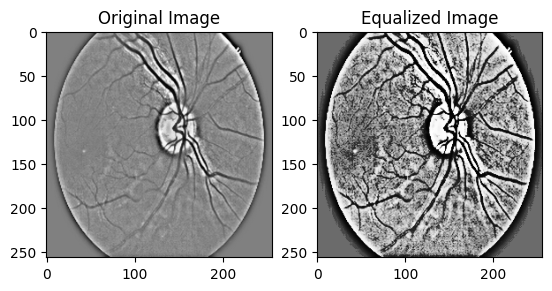

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[3.52328431e-04 1.07650903e-03 4.28921569e-04 3.53710111e-04]]

  [[7.27634804e-04 7.45866974e-04 9.42095588e-04 2.61437908e-04]]

  [[2.52757353e-04 7.68935025e-05 1.91482843e-04 1.46097655e-04]]

  ...

  [[7.65931373e-06 0.00000000e+00 0.00000000e+00 2.30680507e-05]]

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 1.53787005e-05]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 5.38254517e-05]]]


 [[[7.27634804e-04 7.45866974e-04 9.42095588e-04 2.61437908e-04]]

  [[1.05698529e-03 1.75317186e-03 1.36335784e-03 5.84390619e-04]]

  [[3.67647059e-04 5.45943868e-04 6.28063725e-04 3.22952710e-04]]

  ...

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 3.07574010e-05]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 1.53787005e-05]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 3.07574010e-05]]]


 [[[2.52757353e-04 7.68935025e-05 1.91482843e-04 1.46097655e-04]]

  [[3.67647059e-04 5.45943868e-04 6.28063725e-04 3.22952710e-04]]

  [[3.98284

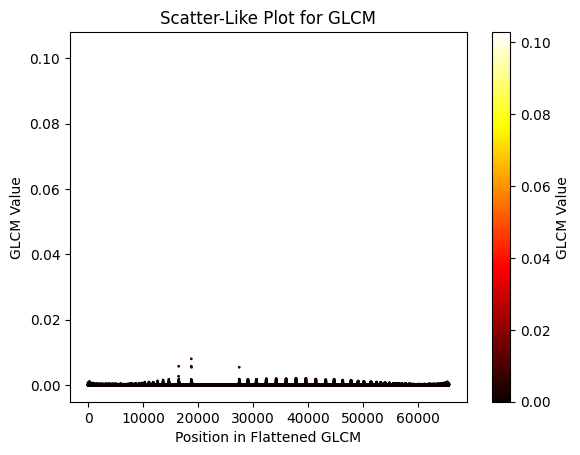

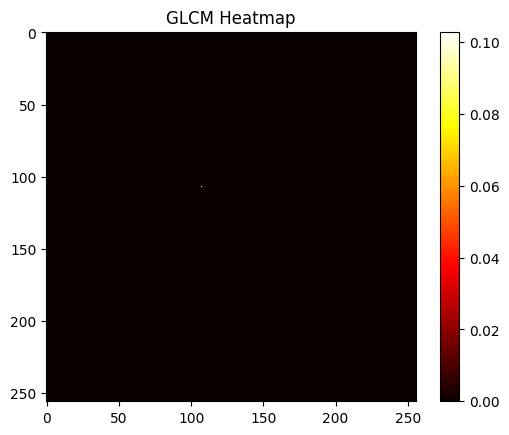

Processing: Healthy_691.png


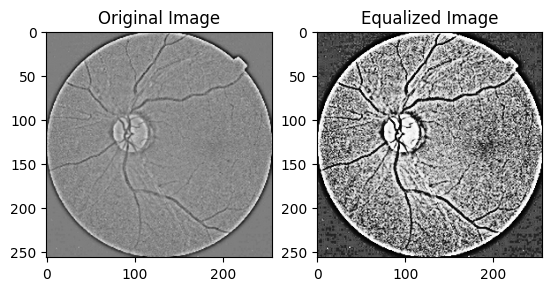

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[6.89338235e-04 9.22722030e-05 4.90196078e-04 6.15148020e-05]]

  [[2.45098039e-04 1.53787005e-04 2.29779412e-04 1.07650903e-04]]

  [[9.95710784e-05 1.46097655e-04 1.76164216e-04 9.22722030e-05]]

  ...

  [[2.29779412e-05 3.84467512e-05 3.06372549e-05 4.61361015e-05]]

  [[7.65931373e-06 1.53787005e-05 0.00000000e+00 3.84467512e-05]]

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 3.84467512e-05]]]


 [[[2.45098039e-04 1.53787005e-04 2.29779412e-04 1.07650903e-04]]

  [[7.65931373e-04 4.30603614e-04 8.27205882e-04 6.30526720e-04]]

  [[5.82107843e-04 3.07574010e-04 5.36151961e-04 4.99807766e-04]]

  ...

  [[3.82965686e-05 8.45828527e-05 3.06372549e-05 6.92041522e-05]]

  [[1.53186275e-05 2.07612457e-04 3.82965686e-05 1.07650903e-04]]

  [[0.00000000e+00 7.68935025e-05 7.65931373e-06 7.68935025e-05]]]


 [[[9.95710784e-05 1.46097655e-04 1.76164216e-04 9.22722030e-05]]

  [[5.82107843e-04 3.07574010e-04 5.36151961e-04 4.99807766e-04]]

  [[5.97426

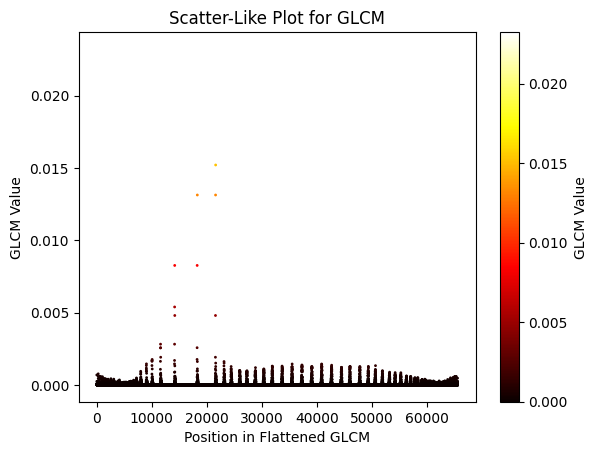

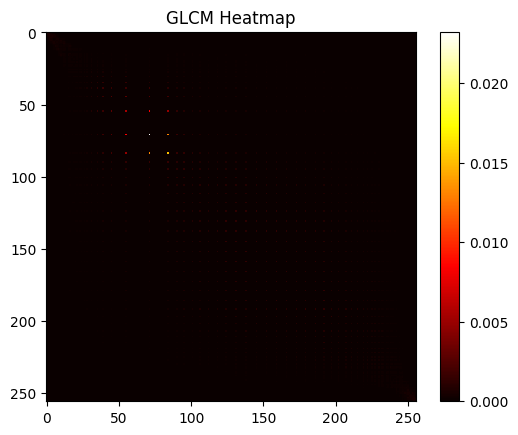

Processing: Healthy_586.png


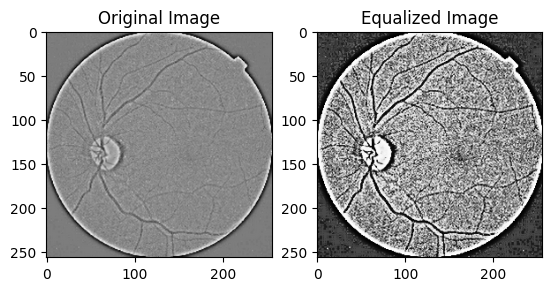

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[5.36151961e-04 6.15148020e-05 5.66789216e-04 0.00000000e+00]]

  [[3.06372549e-04 1.30718954e-04 1.76164216e-04 1.38408304e-04]]

  [[9.19117647e-05 7.68935025e-05 1.22549020e-04 1.30718954e-04]]

  ...

  [[1.53186275e-05 1.53787005e-05 0.00000000e+00 3.84467512e-05]]

  [[7.65931373e-06 3.84467512e-05 0.00000000e+00 2.30680507e-05]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]]


 [[[3.06372549e-04 1.30718954e-04 1.76164216e-04 1.38408304e-04]]

  [[5.36151961e-04 3.38331411e-04 7.81250000e-04 3.69088812e-04]]

  [[4.74877451e-04 4.22914264e-04 6.58700980e-04 4.30603614e-04]]

  ...

  [[4.59558824e-05 1.07650903e-04 2.29779412e-05 1.15340254e-04]]

  [[2.29779412e-05 9.22722030e-05 7.65931373e-06 6.92041522e-05]]

  [[0.00000000e+00 9.22722030e-05 0.00000000e+00 8.45828527e-05]]]


 [[[9.19117647e-05 7.68935025e-05 1.22549020e-04 1.30718954e-04]]

  [[4.74877451e-04 4.22914264e-04 6.58700980e-04 4.30603614e-04]]

  [[6.43382

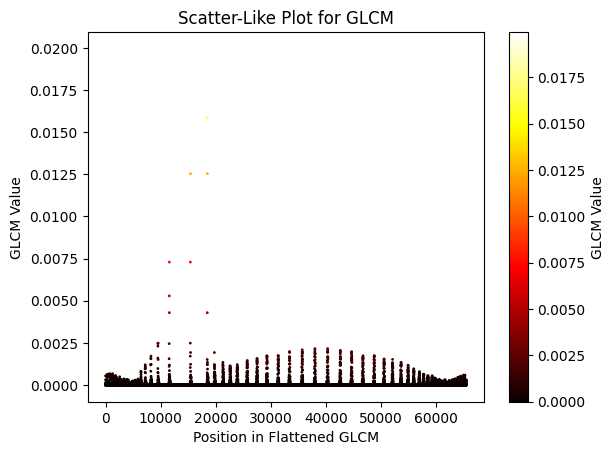

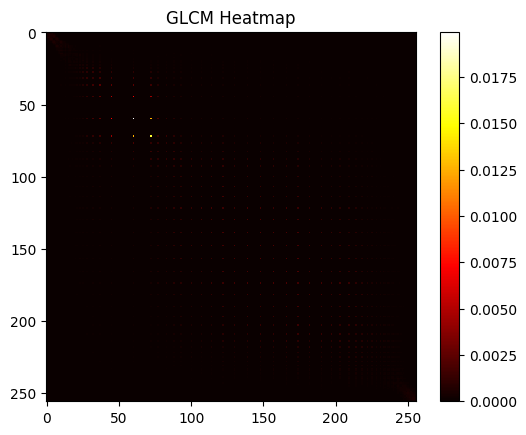

Processing: Healthy_627.png


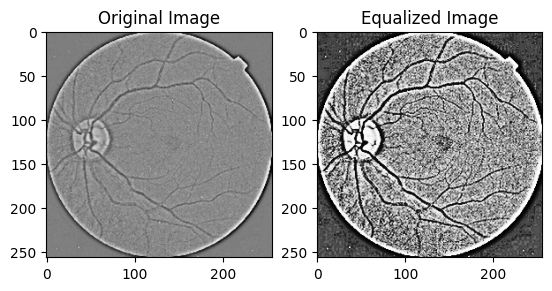

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[1.83823529e-04 1.53787005e-04 7.65931373e-04 2.46059208e-04]]

  [[3.21691176e-04 2.61437908e-04 4.74877451e-04 3.92156863e-04]]

  [[1.99142157e-04 1.53787005e-04 1.76164216e-04 9.99615532e-05]]

  ...

  [[4.59558824e-05 7.68935025e-05 0.00000000e+00 3.84467512e-05]]

  [[3.06372549e-05 7.68935025e-05 0.00000000e+00 6.92041522e-05]]

  [[1.53186275e-05 1.53787005e-05 0.00000000e+00 2.30680507e-05]]]


 [[[3.21691176e-04 2.61437908e-04 4.74877451e-04 3.92156863e-04]]

  [[1.17953431e-03 5.38254517e-04 9.49754902e-04 5.38254517e-04]]

  [[7.27634804e-04 3.76778162e-04 5.51470588e-04 4.53671665e-04]]

  ...

  [[2.29779412e-05 5.38254517e-05 7.65931373e-06 8.45828527e-05]]

  [[2.29779412e-05 6.15148020e-05 0.00000000e+00 6.92041522e-05]]

  [[3.06372549e-05 1.15340254e-04 0.00000000e+00 7.68935025e-05]]]


 [[[1.99142157e-04 1.53787005e-04 1.76164216e-04 9.99615532e-05]]

  [[7.27634804e-04 3.76778162e-04 5.51470588e-04 4.53671665e-04]]

  [[7.04656

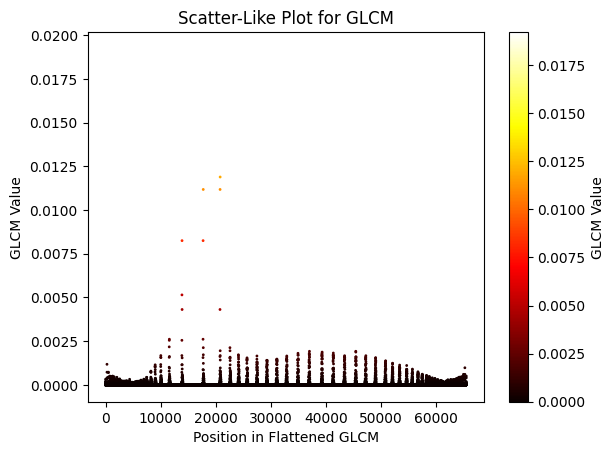

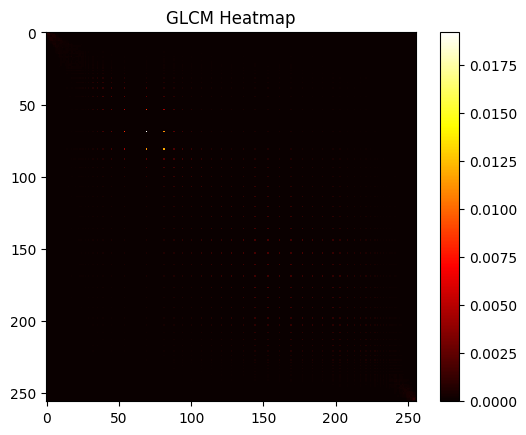

Processing: Healthy_892.png


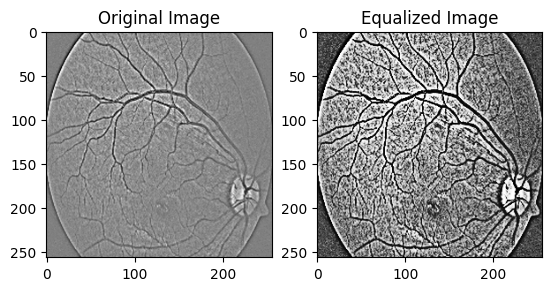

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[1.68504902e-04 1.99923106e-04 3.82965686e-04 3.84467512e-04]]

  [[2.22120098e-04 1.46097655e-04 3.52328431e-04 2.69127259e-04]]

  [[1.68504902e-04 8.45828527e-05 1.91482843e-04 1.23029604e-04]]

  ...

  [[4.59558824e-05 8.45828527e-05 0.00000000e+00 3.07574010e-05]]

  [[7.65931373e-06 8.45828527e-05 0.00000000e+00 7.68935025e-06]]

  [[0.00000000e+00 7.68935025e-05 0.00000000e+00 7.68935025e-06]]]


 [[[2.22120098e-04 1.46097655e-04 3.52328431e-04 2.69127259e-04]]

  [[7.35294118e-04 4.15224913e-04 8.88480392e-04 4.61361015e-04]]

  [[4.90196078e-04 3.15263360e-04 4.59558824e-04 3.76778162e-04]]

  ...

  [[7.65931373e-06 7.68935025e-05 0.00000000e+00 9.99615532e-05]]

  [[2.29779412e-05 6.15148020e-05 0.00000000e+00 6.15148020e-05]]

  [[2.29779412e-05 9.22722030e-05 0.00000000e+00 7.68935025e-06]]]


 [[[1.68504902e-04 8.45828527e-05 1.91482843e-04 1.23029604e-04]]

  [[4.90196078e-04 3.15263360e-04 4.59558824e-04 3.76778162e-04]]

  [[4.44240

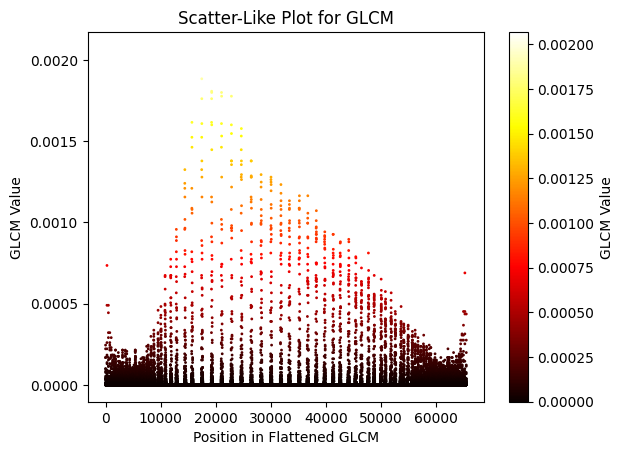

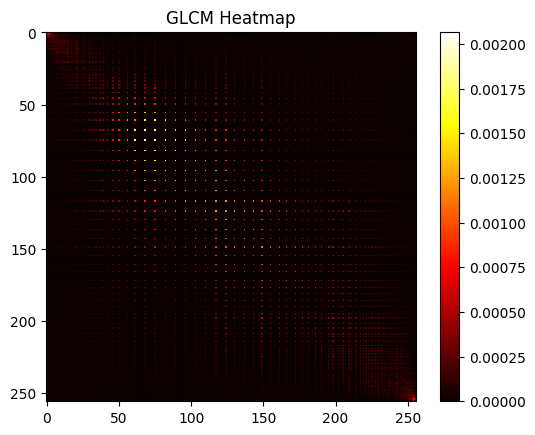

Processing: Healthy_809.png


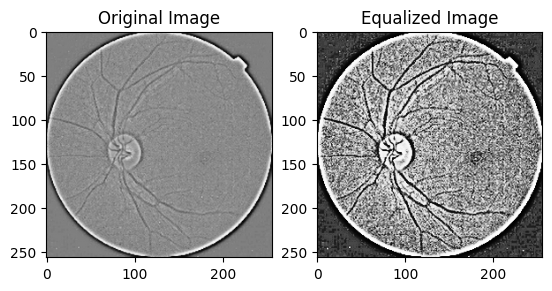

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[3.06372549e-04 1.53787005e-05 3.06372549e-05 9.22722030e-05]]

  [[2.68075980e-04 4.61361015e-05 1.07230392e-04 1.38408304e-04]]

  [[1.22549020e-04 8.45828527e-05 2.06801471e-04 2.22991157e-04]]

  ...

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 3.84467512e-05 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 7.68935025e-06]]]


 [[[2.68075980e-04 4.61361015e-05 1.07230392e-04 1.38408304e-04]]

  [[1.04166667e-03 3.22952710e-04 8.73161765e-04 4.92118416e-04]]

  [[5.82107843e-04 2.92195309e-04 5.97426471e-04 4.92118416e-04]]

  ...

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 3.84467512e-05]]

  [[0.00000000e+00 3.07574010e-05 0.00000000e+00 2.30680507e-05]]

  [[0.00000000e+00 6.92041522e-05 0.00000000e+00 2.30680507e-05]]]


 [[[1.22549020e-04 8.45828527e-05 2.06801471e-04 2.22991157e-04]]

  [[5.82107843e-04 2.92195309e-04 5.97426471e-04 4.92118416e-04]]

  [[5.05514

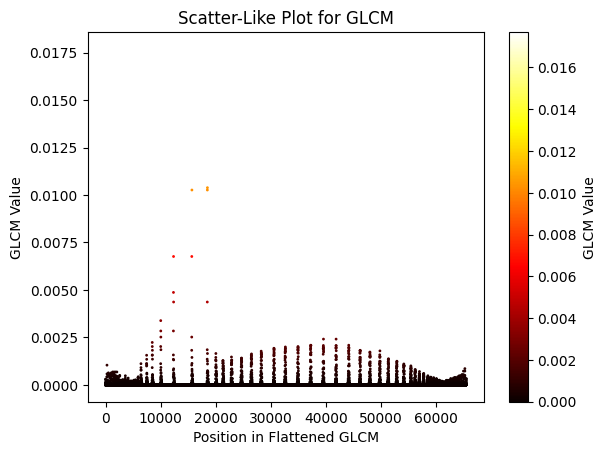

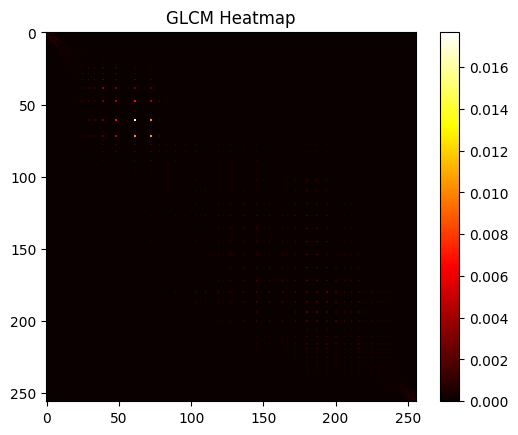

Processing: Healthy_812.png


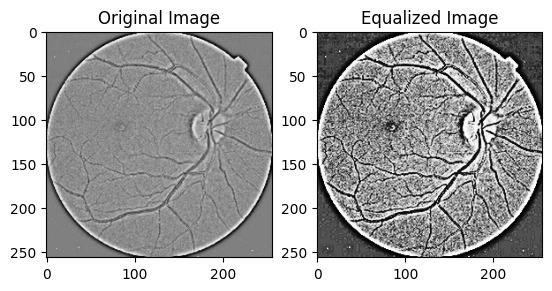

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[5.36151961e-04 1.23029604e-04 3.21691176e-04 6.15148020e-05]]

  [[2.98713235e-04 1.84544406e-04 1.76164216e-04 1.76855056e-04]]

  [[1.60845588e-04 1.84544406e-04 1.68504902e-04 8.45828527e-05]]

  ...

  [[7.65931373e-06 3.84467512e-05 0.00000000e+00 3.07574010e-05]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 3.07574010e-05]]

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 7.68935025e-06]]]


 [[[2.98713235e-04 1.84544406e-04 1.76164216e-04 1.76855056e-04]]

  [[7.04656863e-04 4.15224913e-04 9.49754902e-04 4.15224913e-04]]

  [[5.51470588e-04 2.22991157e-04 6.05085784e-04 4.99807766e-04]]

  ...

  [[1.53186275e-05 9.22722030e-05 2.29779412e-05 8.45828527e-05]]

  [[2.29779412e-05 7.68935025e-05 0.00000000e+00 8.45828527e-05]]

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 3.84467512e-05]]]


 [[[1.60845588e-04 1.84544406e-04 1.68504902e-04 8.45828527e-05]]

  [[5.51470588e-04 2.22991157e-04 6.05085784e-04 4.99807766e-04]]

  [[5.51470

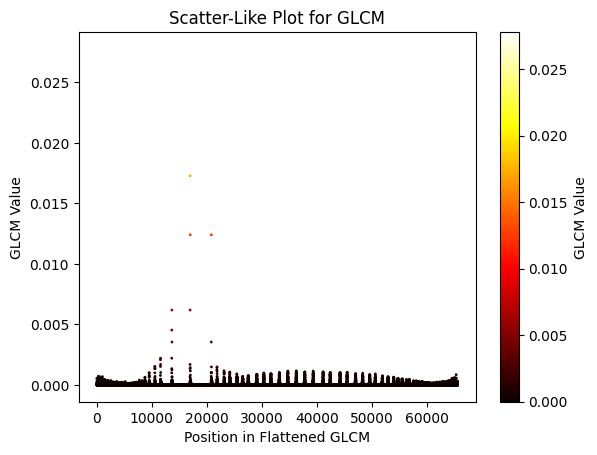

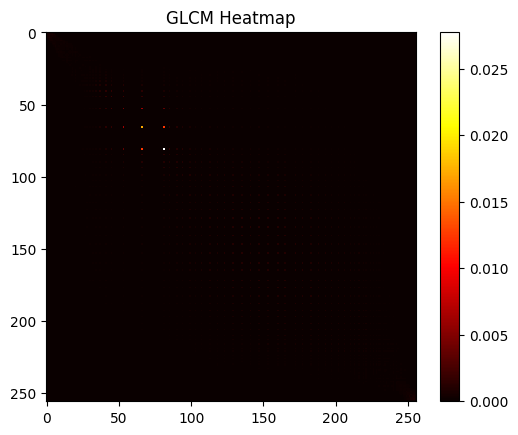

Processing: Healthy_724.png


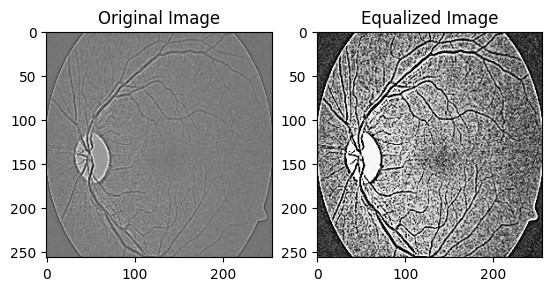

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[1.68504902e-04 2.46059208e-04 8.11887255e-04 2.61437908e-04]]

  [[2.06801471e-04 1.69165705e-04 3.59987745e-04 1.76855056e-04]]

  [[8.42524510e-05 1.15340254e-04 1.22549020e-04 4.61361015e-05]]

  ...

  [[7.65931373e-05 6.92041522e-05 7.65931373e-06 9.99615532e-05]]

  [[7.65931373e-05 9.99615532e-05 0.00000000e+00 1.76855056e-04]]

  [[3.06372549e-05 3.84467512e-05 0.00000000e+00 6.15148020e-05]]]


 [[[2.06801471e-04 1.69165705e-04 3.59987745e-04 1.76855056e-04]]

  [[1.37867647e-04 1.99923106e-04 8.73161765e-04 3.38331411e-04]]

  [[1.68504902e-04 2.22991157e-04 5.51470588e-04 2.69127259e-04]]

  ...

  [[7.65931373e-05 1.23029604e-04 2.29779412e-05 9.99615532e-05]]

  [[8.42524510e-05 1.69165705e-04 7.65931373e-06 1.38408304e-04]]

  [[1.53186275e-05 4.61361015e-05 0.00000000e+00 6.92041522e-05]]]


 [[[8.42524510e-05 1.15340254e-04 1.22549020e-04 4.61361015e-05]]

  [[1.68504902e-04 2.22991157e-04 5.51470588e-04 2.69127259e-04]]

  [[1.22549

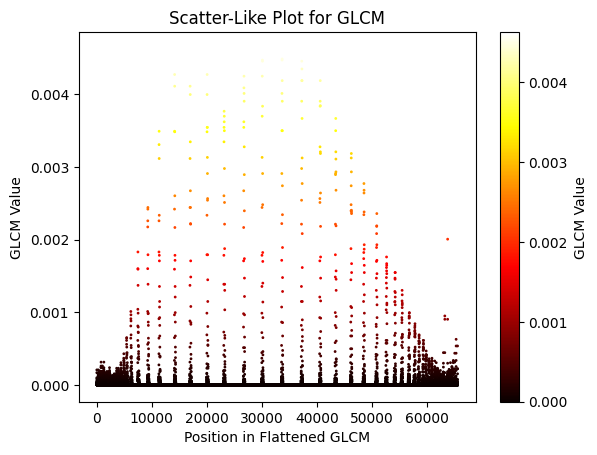

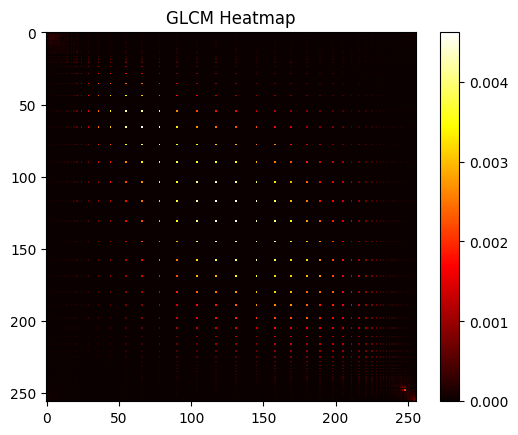

Processing: Healthy_88.png


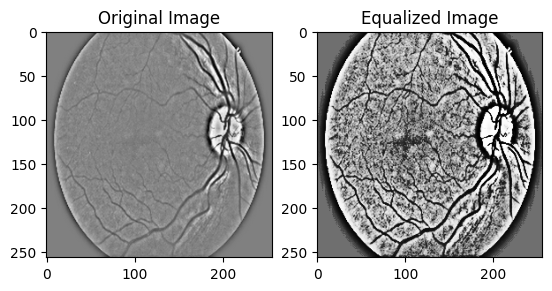

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[5.36151961e-04 8.91964629e-04 1.11825980e-03 3.69088812e-04]]

  [[4.59558824e-04 4.45982314e-04 4.44240196e-04 3.22952710e-04]]

  [[1.76164216e-04 1.69165705e-04 1.45526961e-04 1.61476355e-04]]

  ...

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 1.53787005e-05]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 2.30680507e-05]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 2.30680507e-05]]]


 [[[4.59558824e-04 4.45982314e-04 4.44240196e-04 3.22952710e-04]]

  [[8.73161765e-04 1.47635525e-03 1.54718137e-03 4.15224913e-04]]

  [[5.97426471e-04 6.61284121e-04 6.66360294e-04 3.69088812e-04]]

  ...

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 3.07574010e-05]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 2.30680507e-05]]

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 4.61361015e-05]]]


 [[[1.76164216e-04 1.69165705e-04 1.45526961e-04 1.61476355e-04]]

  [[5.97426471e-04 6.61284121e-04 6.66360294e-04 3.69088812e-04]]

  [[6.12745

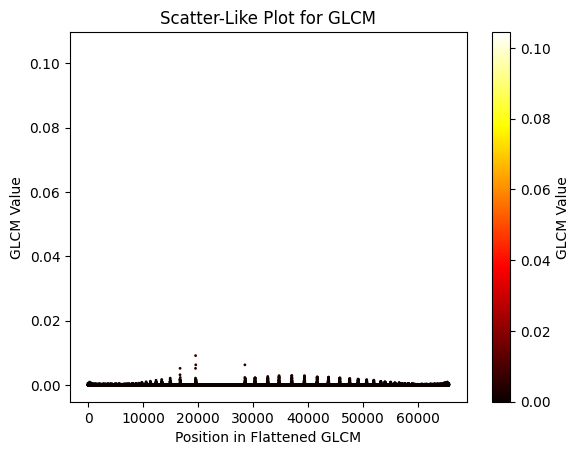

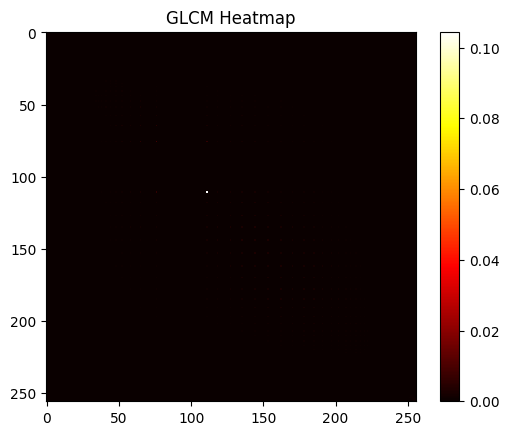

Processing: Healthy_991.png


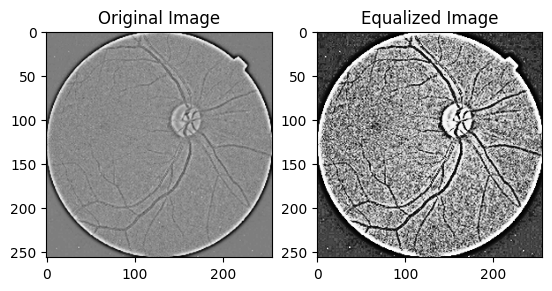

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[5.51470588e-04 1.84544406e-04 3.21691176e-04 6.15148020e-05]]

  [[3.14031863e-04 2.22991157e-04 1.76164216e-04 1.07650903e-04]]

  [[2.29779412e-04 1.84544406e-04 1.60845588e-04 1.07650903e-04]]

  ...

  [[3.06372549e-05 4.61361015e-05 0.00000000e+00 6.92041522e-05]]

  [[7.65931373e-06 1.53787005e-05 0.00000000e+00 3.07574010e-05]]

  [[7.65931373e-06 1.53787005e-05 0.00000000e+00 3.07574010e-05]]]


 [[[3.14031863e-04 2.22991157e-04 1.76164216e-04 1.07650903e-04]]

  [[5.05514706e-04 1.69165705e-04 1.10294118e-03 3.84467512e-04]]

  [[4.05943627e-04 2.76816609e-04 4.59558824e-04 3.84467512e-04]]

  ...

  [[1.53186275e-05 1.07650903e-04 2.29779412e-05 2.30680507e-05]]

  [[0.00000000e+00 4.61361015e-05 0.00000000e+00 3.84467512e-05]]

  [[0.00000000e+00 3.84467512e-05 0.00000000e+00 5.38254517e-05]]]


 [[[2.29779412e-04 1.84544406e-04 1.60845588e-04 1.07650903e-04]]

  [[4.05943627e-04 2.76816609e-04 4.59558824e-04 3.84467512e-04]]

  [[4.74877

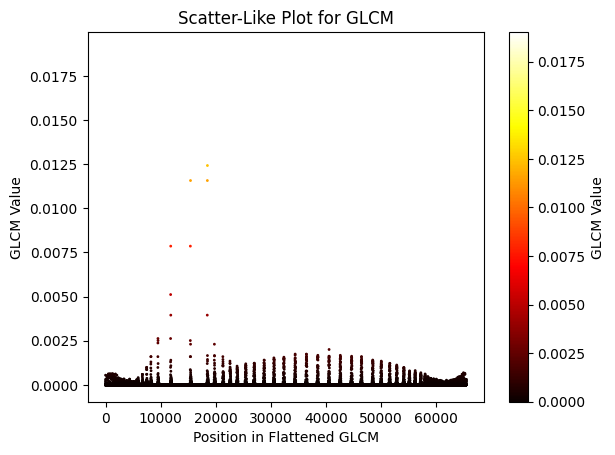

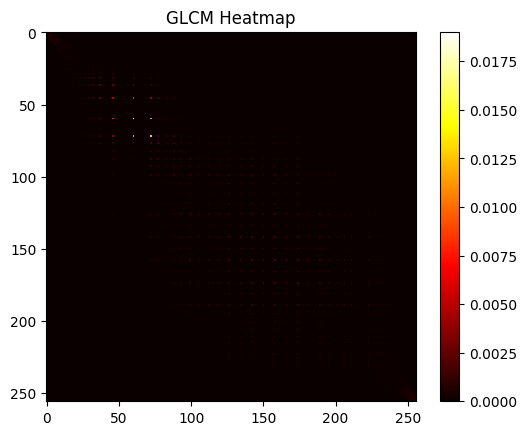

In [ ]:
import os
folder_path = '/content/drive/MyDrive/GLCM RD-sadhu/Healthy_1'
os.chdir(folder_path)

# Iterate through all files
for file_name in os.listdir():
    file_path = os.path.join(folder_path, file_name)
    if os.path.isfile(file_path):
        print("Processing:", file_name)
        img=equ(file_name)
        mat=matrix(img)
        scatter(mat)
        heatmap(mat)


MILD DR

Processing: Mild_DR_278.png


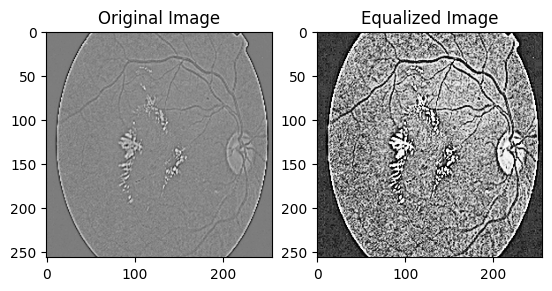

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[1.53186275e-05 0.00000000e+00 6.12745098e-04 1.07650903e-04]]

  [[9.19117647e-05 5.38254517e-05 4.51899510e-04 1.84544406e-04]]

  [[1.60845588e-04 1.30718954e-04 2.68075980e-04 1.99923106e-04]]

  ...

  [[6.12745098e-05 1.23029604e-04 1.53186275e-05 3.07574010e-05]]

  [[6.89338235e-05 1.38408304e-04 7.65931373e-06 5.38254517e-05]]

  [[1.53186275e-05 7.68935025e-06 1.53186275e-05 3.07574010e-05]]]


 [[[9.19117647e-05 5.38254517e-05 4.51899510e-04 1.84544406e-04]]

  [[2.29779412e-04 2.76816609e-04 1.42463235e-03 2.92195309e-04]]

  [[2.37438725e-04 3.92156863e-04 7.50612745e-04 3.15263360e-04]]

  ...

  [[1.22549020e-04 1.61476355e-04 0.00000000e+00 1.38408304e-04]]

  [[1.53186275e-04 1.69165705e-04 7.65931373e-06 1.53787005e-04]]

  [[7.65931373e-05 1.23029604e-04 7.65931373e-06 4.61361015e-05]]]


 [[[1.60845588e-04 1.30718954e-04 2.68075980e-04 1.99923106e-04]]

  [[2.37438725e-04 3.92156863e-04 7.50612745e-04 3.15263360e-04]]

  [[3.06372

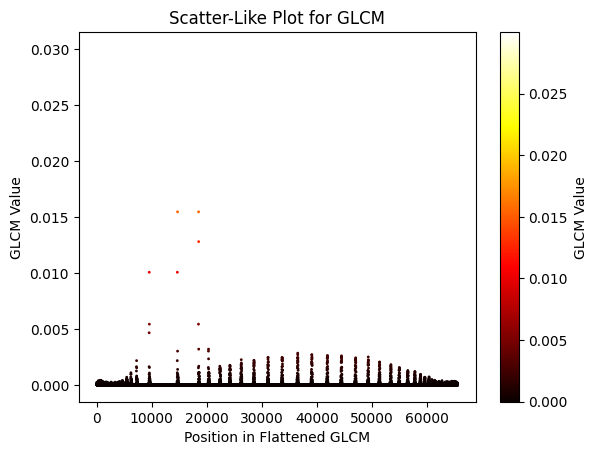

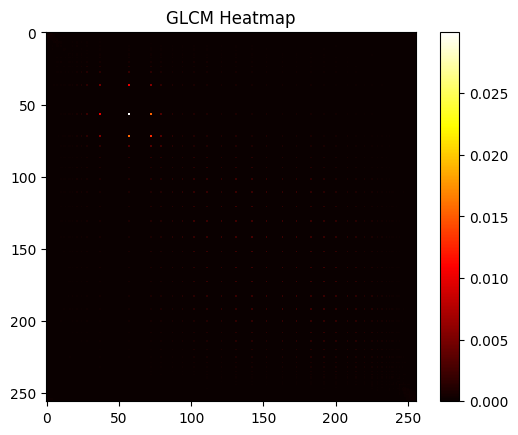

Processing: Mild_DR_250.png


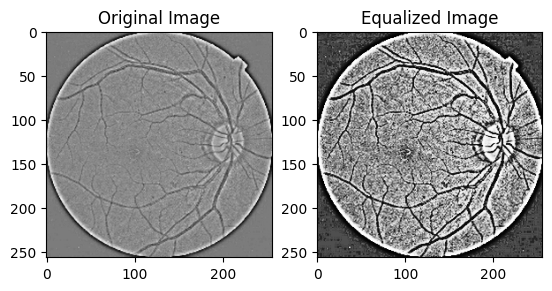

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[3.67647059e-04 6.15148020e-05 5.20833333e-04 0.00000000e+00]]

  [[2.68075980e-04 1.30718954e-04 2.37438725e-04 8.45828527e-05]]

  [[6.12745098e-05 9.22722030e-05 1.22549020e-04 6.92041522e-05]]

  ...

  [[2.29779412e-05 2.30680507e-05 0.00000000e+00 3.84467512e-05]]

  [[1.53186275e-05 3.84467512e-05 0.00000000e+00 1.53787005e-05]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 1.53787005e-05]]]


 [[[2.68075980e-04 1.30718954e-04 2.37438725e-04 8.45828527e-05]]

  [[7.81250000e-04 5.53633218e-04 9.19117647e-04 3.38331411e-04]]

  [[4.51899510e-04 3.61399462e-04 3.75306373e-04 3.15263360e-04]]

  ...

  [[3.06372549e-05 1.53787005e-05 7.65931373e-06 1.07650903e-04]]

  [[5.36151961e-05 8.45828527e-05 1.53186275e-05 1.23029604e-04]]

  [[0.00000000e+00 3.84467512e-05 0.00000000e+00 7.68935025e-05]]]


 [[[6.12745098e-05 9.22722030e-05 1.22549020e-04 6.92041522e-05]]

  [[4.51899510e-04 3.61399462e-04 3.75306373e-04 3.15263360e-04]]

  [[5.51470

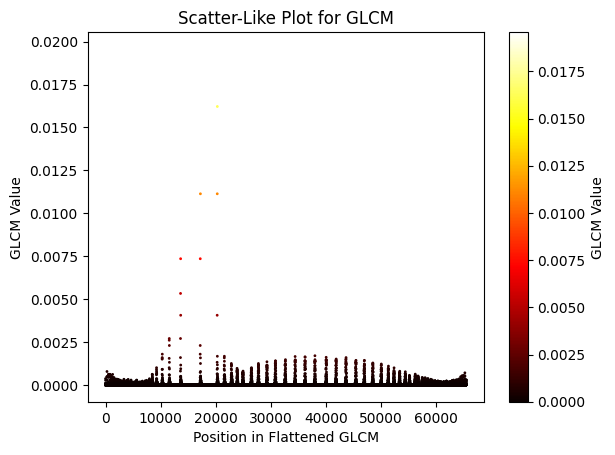

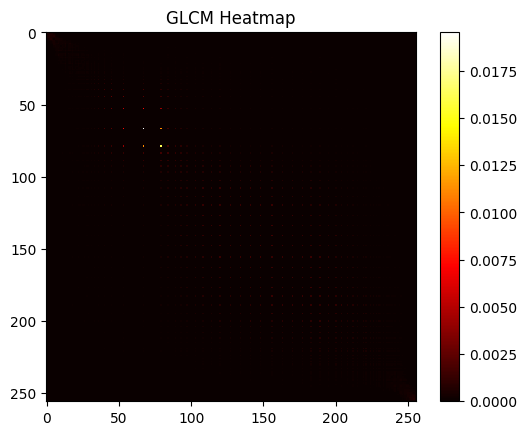

Processing: Mild_DR_248.png


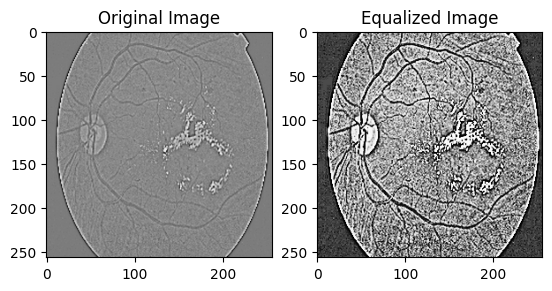

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[3.06372549e-05 0.00000000e+00 5.51470588e-04 6.15148020e-05]]

  [[6.12745098e-05 9.22722030e-05 5.36151961e-04 1.69165705e-04]]

  [[1.53186275e-04 1.61476355e-04 2.29779412e-04 2.30680507e-04]]

  ...

  [[4.59558824e-05 1.15340254e-04 3.06372549e-05 4.61361015e-05]]

  [[2.29779412e-05 6.92041522e-05 1.53186275e-05 5.38254517e-05]]

  [[2.29779412e-05 7.68935025e-06 0.00000000e+00 2.30680507e-05]]]


 [[[6.12745098e-05 9.22722030e-05 5.36151961e-04 1.69165705e-04]]

  [[2.60416667e-04 4.15224913e-04 1.16421569e-03 1.84544406e-04]]

  [[2.83394608e-04 3.46020761e-04 7.27634804e-04 2.53748558e-04]]

  ...

  [[1.30208333e-04 1.38408304e-04 0.00000000e+00 1.92233756e-04]]

  [[1.22549020e-04 9.99615532e-05 7.65931373e-06 1.53787005e-04]]

  [[6.89338235e-05 6.92041522e-05 0.00000000e+00 4.61361015e-05]]]


 [[[1.53186275e-04 1.61476355e-04 2.29779412e-04 2.30680507e-04]]

  [[2.83394608e-04 3.46020761e-04 7.27634804e-04 2.53748558e-04]]

  [[2.60416

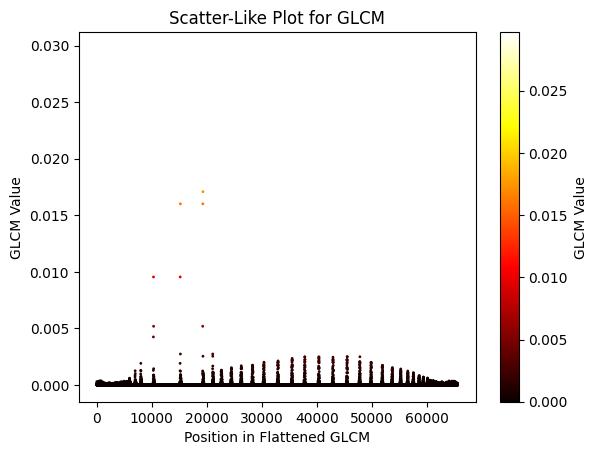

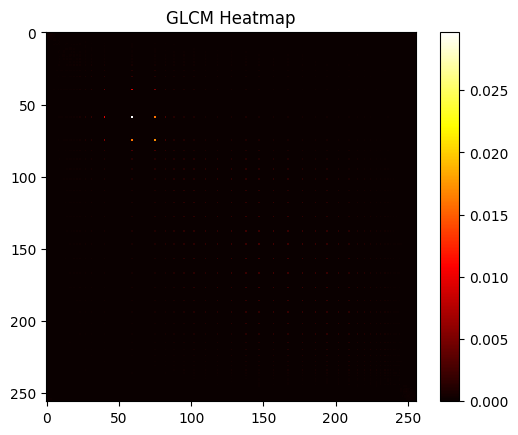

Processing: Mild_DR_218.png


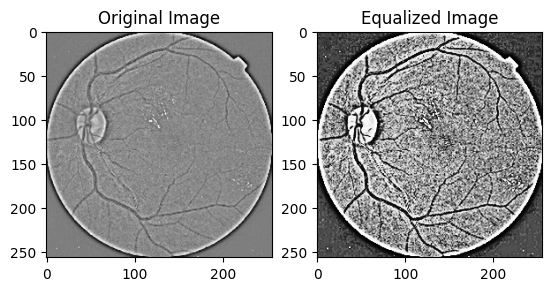

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[2.29779412e-04 6.15148020e-05 3.21691176e-04 4.61361015e-05]]

  [[2.52757353e-04 1.07650903e-04 1.76164216e-04 1.46097655e-04]]

  [[1.30208333e-04 9.22722030e-05 9.95710784e-05 9.99615532e-05]]

  ...

  [[0.00000000e+00 1.53787005e-05 0.00000000e+00 1.53787005e-05]]

  [[0.00000000e+00 4.61361015e-05 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 3.07574010e-05 0.00000000e+00 2.30680507e-05]]]


 [[[2.52757353e-04 1.07650903e-04 1.76164216e-04 1.46097655e-04]]

  [[9.34436275e-04 5.38254517e-04 9.19117647e-04 4.30603614e-04]]

  [[5.28492647e-04 3.30642061e-04 6.20404412e-04 4.38292964e-04]]

  ...

  [[2.29779412e-05 7.68935025e-05 3.06372549e-05 8.45828527e-05]]

  [[0.00000000e+00 5.38254517e-05 0.00000000e+00 7.68935025e-05]]

  [[7.65931373e-06 7.68935025e-05 0.00000000e+00 5.38254517e-05]]]


 [[[1.30208333e-04 9.22722030e-05 9.95710784e-05 9.99615532e-05]]

  [[5.28492647e-04 3.30642061e-04 6.20404412e-04 4.38292964e-04]]

  [[4.44240

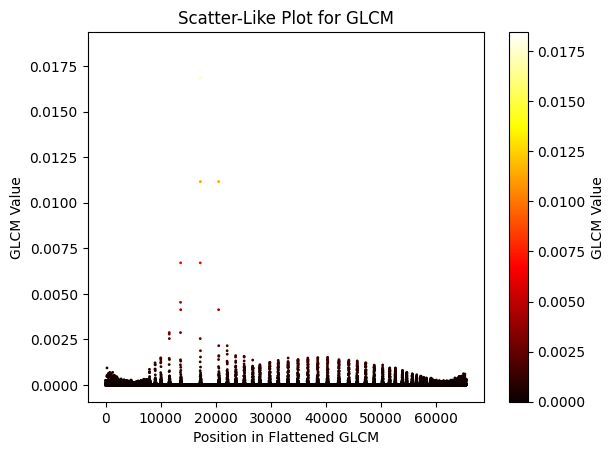

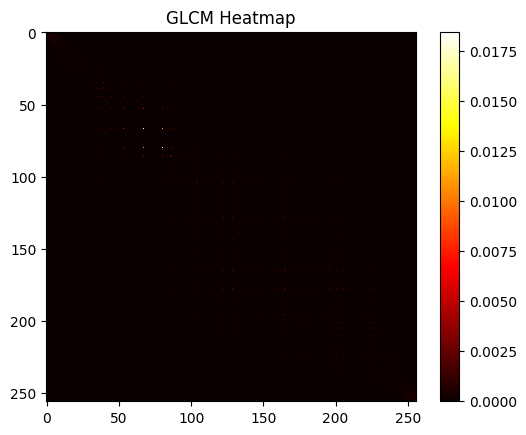

Processing: Mild_DR_214.png


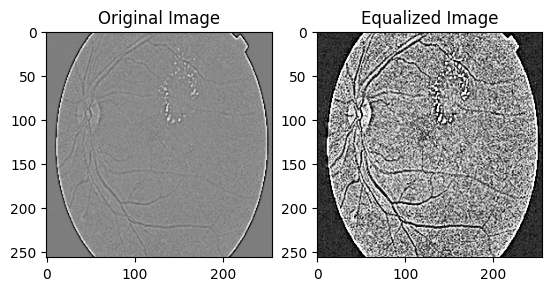

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[1.53186275e-05 3.07574010e-05 5.05514706e-04 3.07574010e-05]]

  [[4.59558824e-05 9.99615532e-05 5.13174020e-04 1.84544406e-04]]

  [[1.37867647e-04 2.15301807e-04 3.98284314e-04 2.30680507e-04]]

  ...

  [[1.45526961e-04 1.99923106e-04 3.82965686e-05 2.22991157e-04]]

  [[3.82965686e-05 6.15148020e-05 0.00000000e+00 4.61361015e-05]]

  [[2.29779412e-05 1.53787005e-05 0.00000000e+00 1.53787005e-05]]]


 [[[4.59558824e-05 9.99615532e-05 5.13174020e-04 1.84544406e-04]]

  [[2.29779412e-04 2.30680507e-04 1.71568627e-03 3.22952710e-04]]

  [[4.44240196e-04 4.45982314e-04 7.19975490e-04 4.84429066e-04]]

  ...

  [[1.68504902e-04 2.46059208e-04 6.89338235e-05 2.15301807e-04]]

  [[2.52757353e-04 2.61437908e-04 2.29779412e-05 2.53748558e-04]]

  [[7.65931373e-05 1.46097655e-04 0.00000000e+00 9.22722030e-05]]]


 [[[1.37867647e-04 2.15301807e-04 3.98284314e-04 2.30680507e-04]]

  [[4.44240196e-04 4.45982314e-04 7.19975490e-04 4.84429066e-04]]

  [[5.51470

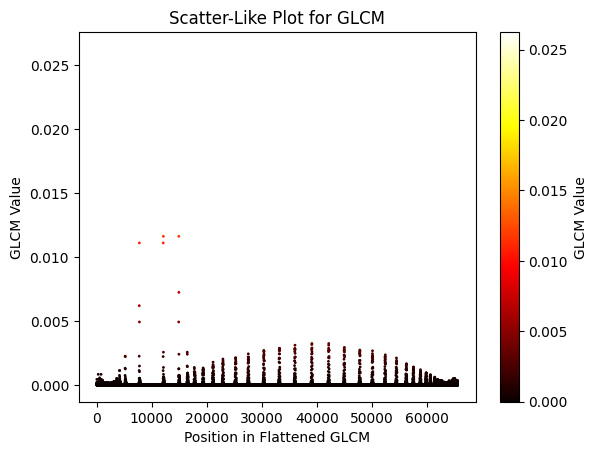

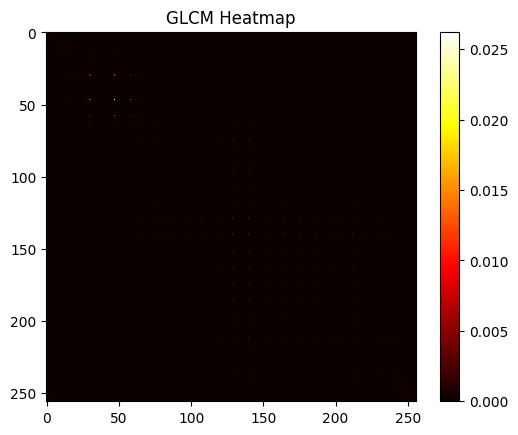

Processing: Mild_DR_212.png


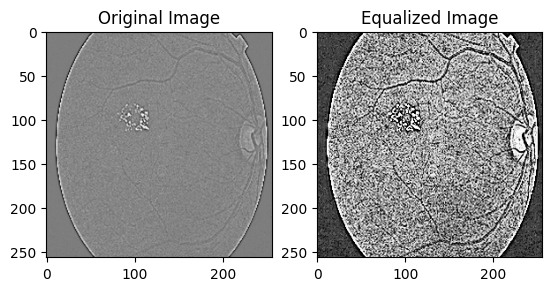

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[3.06372549e-05 0.00000000e+00 5.51470588e-04 6.15148020e-05]]

  [[6.12745098e-05 6.15148020e-05 4.74877451e-04 1.46097655e-04]]

  [[1.53186275e-04 1.92233756e-04 2.06801471e-04 1.76855056e-04]]

  ...

  [[1.37867647e-04 1.30718954e-04 2.29779412e-05 1.07650903e-04]]

  [[1.07230392e-04 9.22722030e-05 1.53186275e-05 9.22722030e-05]]

  [[1.53186275e-05 3.84467512e-05 0.00000000e+00 3.07574010e-05]]]


 [[[6.12745098e-05 6.15148020e-05 4.74877451e-04 1.46097655e-04]]

  [[2.75735294e-04 3.07574010e-04 1.53186275e-03 3.53710111e-04]]

  [[3.52328431e-04 4.99807766e-04 8.57843137e-04 3.46020761e-04]]

  ...

  [[2.22120098e-04 2.46059208e-04 5.36151961e-05 3.15263360e-04]]

  [[1.91482843e-04 1.99923106e-04 4.59558824e-05 2.15301807e-04]]

  [[4.59558824e-05 8.45828527e-05 1.53186275e-05 4.61361015e-05]]]


 [[[1.53186275e-04 1.92233756e-04 2.06801471e-04 1.76855056e-04]]

  [[3.52328431e-04 4.99807766e-04 8.57843137e-04 3.46020761e-04]]

  [[4.59558

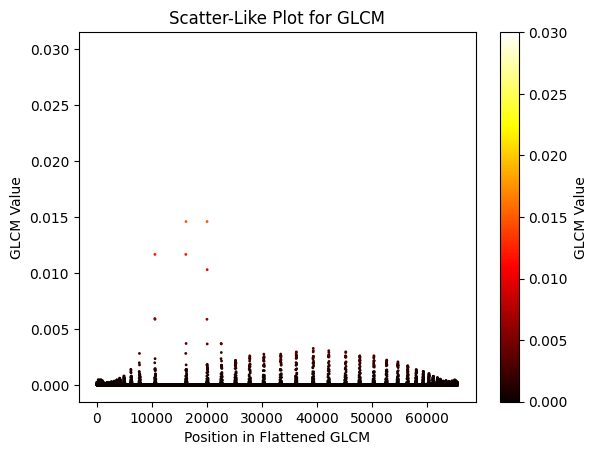

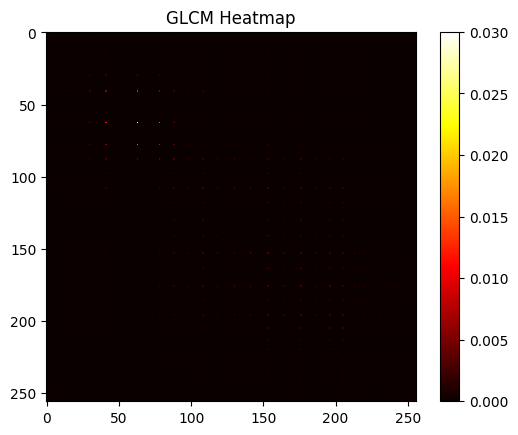

Processing: Mild_DR_191.png


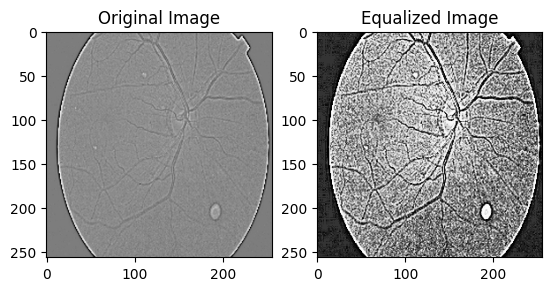

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[0.00000000e+00 3.07574010e-05 5.97426471e-04 9.22722030e-05]]

  [[6.89338235e-05 1.07650903e-04 5.20833333e-04 1.69165705e-04]]

  [[1.99142157e-04 2.07612457e-04 3.98284314e-04 1.99923106e-04]]

  ...

  [[1.45526961e-04 1.53787005e-04 2.29779412e-05 1.69165705e-04]]

  [[1.14889706e-04 1.84544406e-04 0.00000000e+00 1.38408304e-04]]

  [[2.29779412e-05 1.53787005e-05 0.00000000e+00 1.53787005e-05]]]


 [[[6.89338235e-05 1.07650903e-04 5.20833333e-04 1.69165705e-04]]

  [[1.99142157e-04 3.53710111e-04 1.60845588e-03 3.07574010e-04]]

  [[5.13174020e-04 4.84429066e-04 7.35294118e-04 4.84429066e-04]]

  ...

  [[1.91482843e-04 2.22991157e-04 5.36151961e-05 2.15301807e-04]]

  [[1.83823529e-04 2.30680507e-04 3.06372549e-05 2.84505959e-04]]

  [[7.65931373e-05 1.30718954e-04 7.65931373e-06 1.15340254e-04]]]


 [[[1.99142157e-04 2.07612457e-04 3.98284314e-04 1.99923106e-04]]

  [[5.13174020e-04 4.84429066e-04 7.35294118e-04 4.84429066e-04]]

  [[5.20833

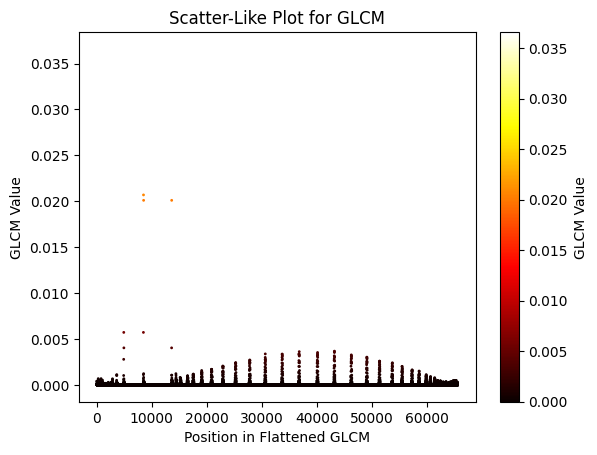

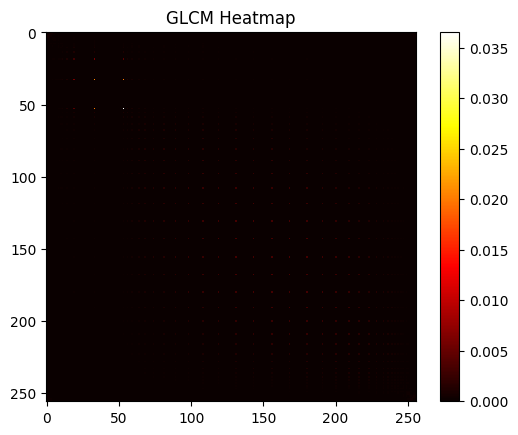

Processing: Mild_DR_206.png


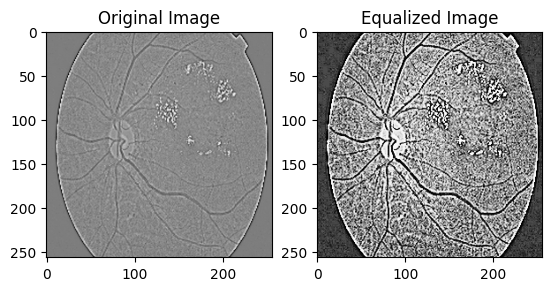

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[1.53186275e-05 6.15148020e-05 5.20833333e-04 1.07650903e-04]]

  [[7.65931373e-05 6.15148020e-05 5.43811275e-04 1.07650903e-04]]

  [[1.76164216e-04 1.53787005e-04 3.37009804e-04 1.92233756e-04]]

  ...

  [[8.42524510e-05 1.23029604e-04 7.65931373e-06 1.07650903e-04]]

  [[6.12745098e-05 1.23029604e-04 2.29779412e-05 5.38254517e-05]]

  [[2.29779412e-05 0.00000000e+00 0.00000000e+00 1.53787005e-05]]]


 [[[7.65931373e-05 6.15148020e-05 5.43811275e-04 1.07650903e-04]]

  [[3.52328431e-04 3.53710111e-04 1.34803922e-03 3.84467512e-04]]

  [[2.37438725e-04 4.38292964e-04 6.81678922e-04 4.30603614e-04]]

  ...

  [[1.53186275e-04 1.61476355e-04 1.53186275e-05 1.92233756e-04]]

  [[1.68504902e-04 2.07612457e-04 1.53186275e-05 1.46097655e-04]]

  [[4.59558824e-05 6.15148020e-05 0.00000000e+00 6.15148020e-05]]]


 [[[1.76164216e-04 1.53787005e-04 3.37009804e-04 1.92233756e-04]]

  [[2.37438725e-04 4.38292964e-04 6.81678922e-04 4.30603614e-04]]

  [[3.98284

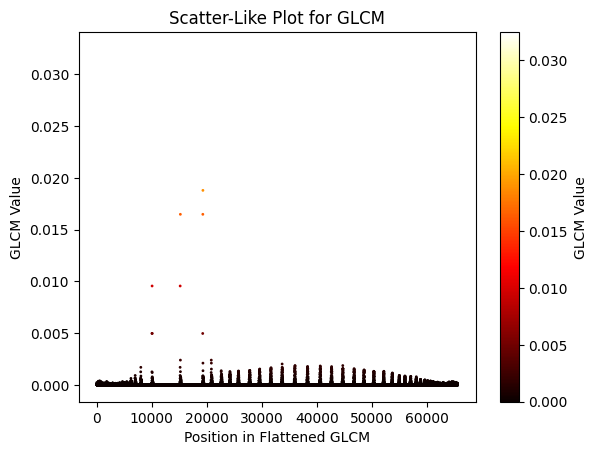

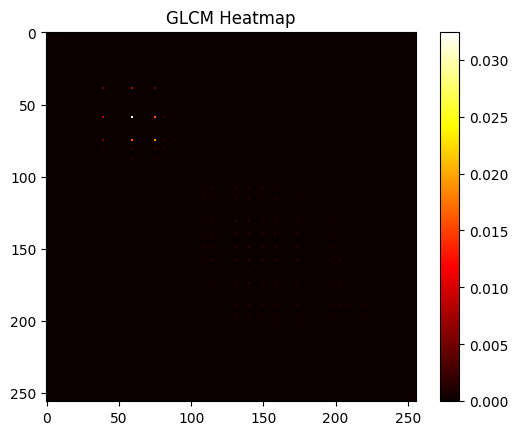

Processing: Mild_DR_207.png


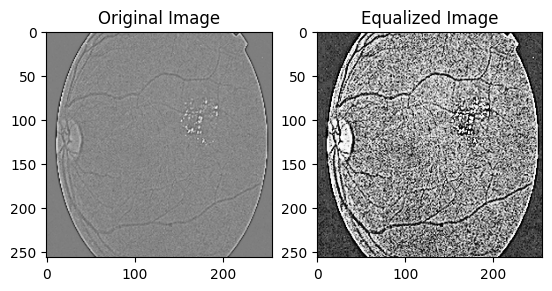

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[0.00000000e+00 0.00000000e+00 7.96568627e-04 9.22722030e-05]]

  [[6.89338235e-05 6.92041522e-05 4.44240196e-04 1.23029604e-04]]

  [[1.37867647e-04 1.99923106e-04 1.91482843e-04 2.15301807e-04]]

  ...

  [[6.89338235e-05 1.53787005e-04 1.53186275e-05 1.07650903e-04]]

  [[1.22549020e-04 1.30718954e-04 1.53186275e-05 9.22722030e-05]]

  [[2.29779412e-05 2.30680507e-05 0.00000000e+00 3.07574010e-05]]]


 [[[6.89338235e-05 6.92041522e-05 4.44240196e-04 1.23029604e-04]]

  [[3.67647059e-04 4.30603614e-04 1.62377451e-03 3.84467512e-04]]

  [[3.29350490e-04 4.61361015e-04 8.65502451e-04 4.53671665e-04]]

  ...

  [[2.14460784e-04 1.99923106e-04 1.53186275e-05 2.76816609e-04]]

  [[2.22120098e-04 2.22991157e-04 1.53186275e-05 2.38369858e-04]]

  [[7.65931373e-05 9.22722030e-05 7.65931373e-06 6.92041522e-05]]]


 [[[1.37867647e-04 1.99923106e-04 1.91482843e-04 2.15301807e-04]]

  [[3.29350490e-04 4.61361015e-04 8.65502451e-04 4.53671665e-04]]

  [[4.59558

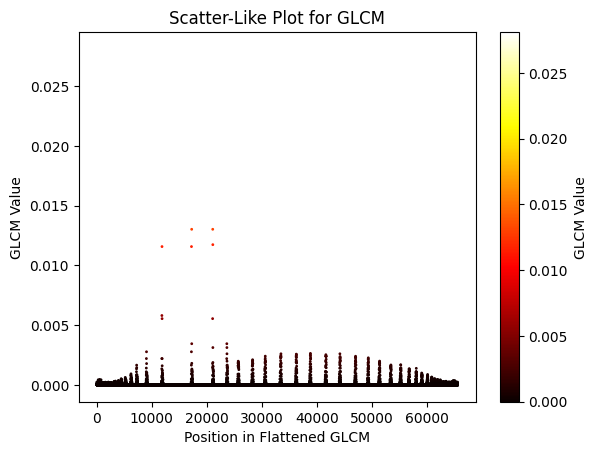

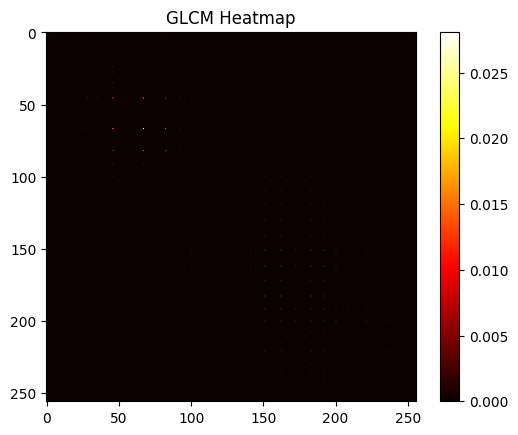

Processing: Mild_DR_18.png


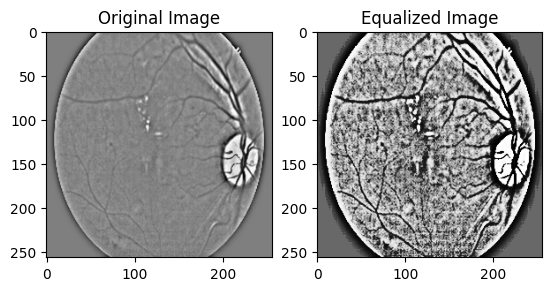

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[4.13602941e-04 5.53633218e-04 7.96568627e-04 4.45982314e-04]]

  [[4.82536765e-04 4.61361015e-04 6.28063725e-04 2.69127259e-04]]

  [[2.83394608e-04 2.38369858e-04 1.37867647e-04 1.30718954e-04]]

  ...

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 1.53787005e-05]]

  [[7.65931373e-06 1.53787005e-05 0.00000000e+00 3.84467512e-05]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 0.00000000e+00]]]


 [[[4.82536765e-04 4.61361015e-04 6.28063725e-04 2.69127259e-04]]

  [[6.58700980e-04 1.06113033e-03 1.25612745e-03 5.99769319e-04]]

  [[4.51899510e-04 5.99769319e-04 7.19975490e-04 4.69050365e-04]]

  ...

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 7.68935025e-06]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 3.07574010e-05]]]


 [[[2.83394608e-04 2.38369858e-04 1.37867647e-04 1.30718954e-04]]

  [[4.51899510e-04 5.99769319e-04 7.19975490e-04 4.69050365e-04]]

  [[4.13602

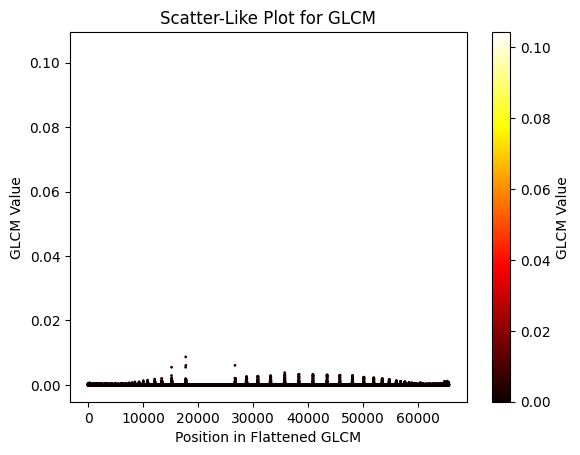

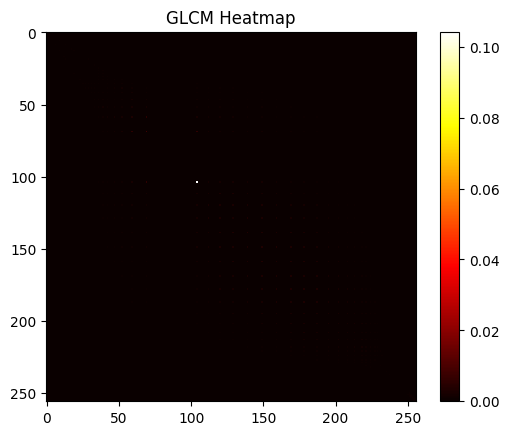

Processing: Mild_DR_177.png


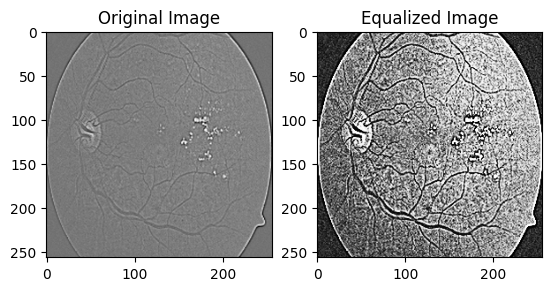

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[1.22549020e-04 1.84544406e-04 8.73161765e-04 4.61361015e-05]]

  [[1.22549020e-04 2.38369858e-04 4.90196078e-04 4.61361015e-05]]

  [[1.99142157e-04 1.38408304e-04 2.14460784e-04 1.15340254e-04]]

  ...

  [[8.42524510e-05 1.38408304e-04 1.53186275e-05 1.38408304e-04]]

  [[1.30208333e-04 1.46097655e-04 0.00000000e+00 2.38369858e-04]]

  [[7.65931373e-06 0.00000000e+00 0.00000000e+00 3.84467512e-05]]]


 [[[1.22549020e-04 2.38369858e-04 4.90196078e-04 4.61361015e-05]]

  [[3.67647059e-04 5.84390619e-04 1.25612745e-03 4.61361015e-04]]

  [[4.97855392e-04 2.61437908e-04 7.88909314e-04 5.22875817e-04]]

  ...

  [[1.22549020e-04 1.76855056e-04 7.65931373e-06 9.22722030e-05]]

  [[6.12745098e-05 1.61476355e-04 7.65931373e-06 2.22991157e-04]]

  [[1.53186275e-05 3.84467512e-05 0.00000000e+00 8.45828527e-05]]]


 [[[1.99142157e-04 1.38408304e-04 2.14460784e-04 1.15340254e-04]]

  [[4.97855392e-04 2.61437908e-04 7.88909314e-04 5.22875817e-04]]

  [[4.44240

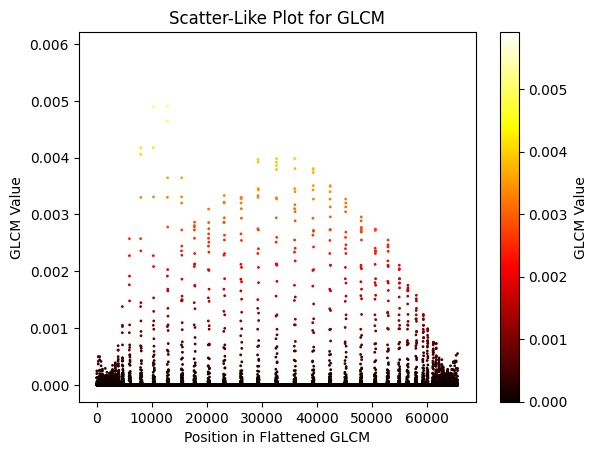

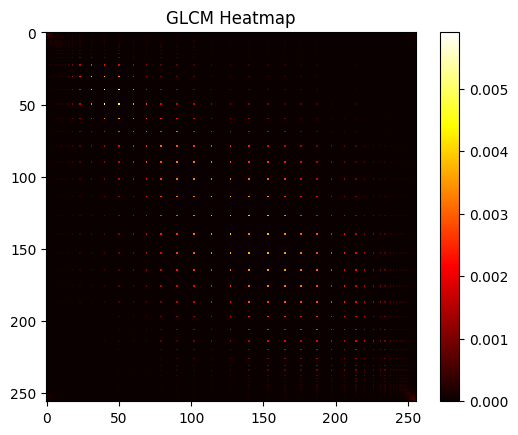

Processing: Mild_DR_143.png


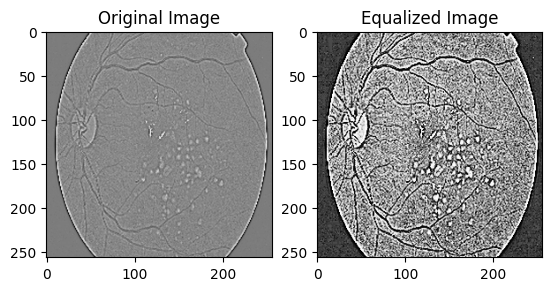

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[1.53186275e-05 0.00000000e+00 7.19975490e-04 9.22722030e-05]]

  [[3.06372549e-05 5.38254517e-05 4.44240196e-04 1.07650903e-04]]

  [[1.60845588e-04 1.61476355e-04 2.83394608e-04 2.38369858e-04]]

  ...

  [[9.95710784e-05 9.99615532e-05 0.00000000e+00 1.30718954e-04]]

  [[8.42524510e-05 1.15340254e-04 0.00000000e+00 8.45828527e-05]]

  [[1.53186275e-05 2.30680507e-05 0.00000000e+00 2.30680507e-05]]]


 [[[3.06372549e-05 5.38254517e-05 4.44240196e-04 1.07650903e-04]]

  [[2.91053922e-04 4.92118416e-04 1.53186275e-03 4.61361015e-04]]

  [[4.59558824e-04 5.61322568e-04 8.57843137e-04 4.22914264e-04]]

  ...

  [[1.91482843e-04 2.46059208e-04 7.65931373e-06 2.46059208e-04]]

  [[1.99142157e-04 2.69127259e-04 3.06372549e-05 3.07574010e-04]]

  [[1.07230392e-04 1.15340254e-04 0.00000000e+00 1.07650903e-04]]]


 [[[1.60845588e-04 1.61476355e-04 2.83394608e-04 2.38369858e-04]]

  [[4.59558824e-04 5.61322568e-04 8.57843137e-04 4.22914264e-04]]

  [[3.98284

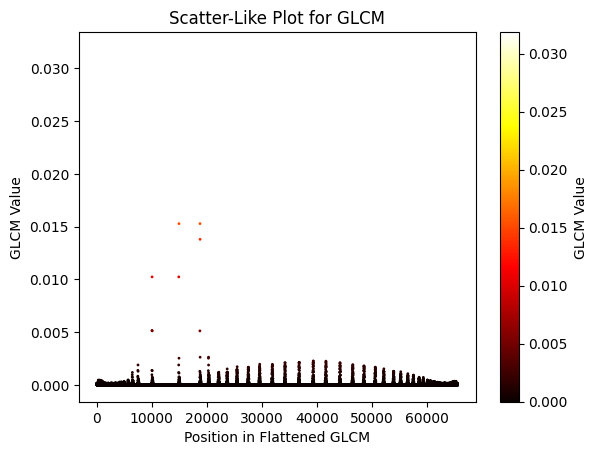

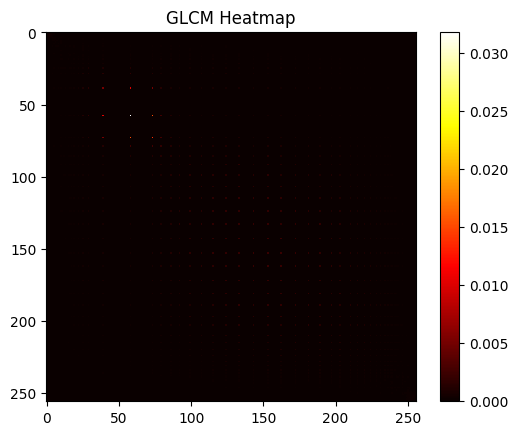

Processing: Mild_DR_10.png


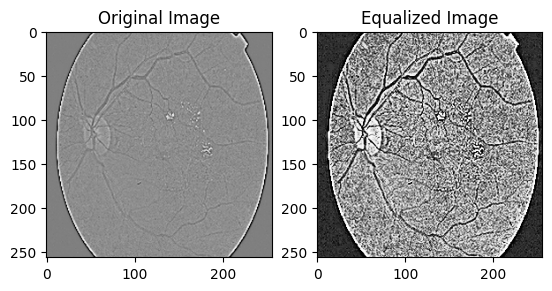

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[4.59558824e-05 1.38408304e-04 7.35294118e-04 2.46059208e-04]]

  [[1.22549020e-04 1.61476355e-04 6.20404412e-04 2.22991157e-04]]

  [[3.21691176e-04 2.92195309e-04 5.20833333e-04 2.84505959e-04]]

  ...

  [[1.30208333e-04 2.46059208e-04 7.65931373e-06 1.99923106e-04]]

  [[9.19117647e-05 1.46097655e-04 7.65931373e-06 1.23029604e-04]]

  [[4.59558824e-05 7.68935025e-05 0.00000000e+00 6.15148020e-05]]]


 [[[1.22549020e-04 1.61476355e-04 6.20404412e-04 2.22991157e-04]]

  [[2.75735294e-04 2.92195309e-04 1.73100490e-03 3.07574010e-04]]

  [[4.90196078e-04 5.07497116e-04 6.89338235e-04 5.38254517e-04]]

  ...

  [[1.53186275e-04 1.53787005e-04 4.59558824e-05 1.53787005e-04]]

  [[1.76164216e-04 2.22991157e-04 3.82965686e-05 2.30680507e-04]]

  [[9.19117647e-05 1.53787005e-04 7.65931373e-06 1.23029604e-04]]]


 [[[3.21691176e-04 2.92195309e-04 5.20833333e-04 2.84505959e-04]]

  [[4.90196078e-04 5.07497116e-04 6.89338235e-04 5.38254517e-04]]

  [[3.82965

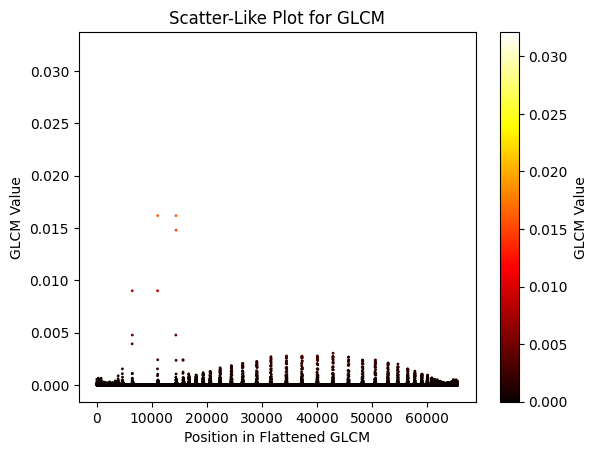

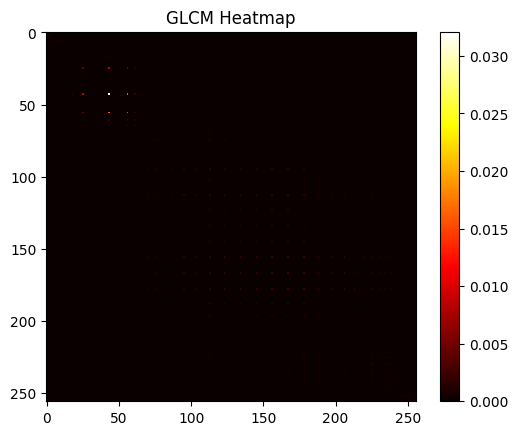

Processing: Mild_DR_157.png


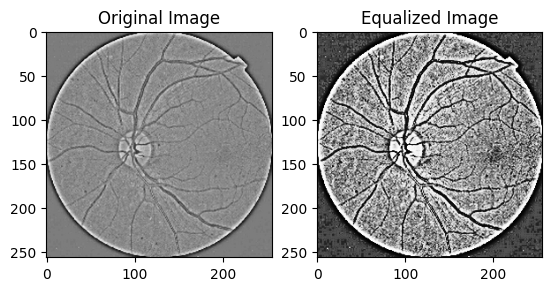

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[4.74877451e-04 0.00000000e+00 6.74019608e-04 9.22722030e-05]]

  [[2.37438725e-04 7.68935025e-05 1.68504902e-04 1.76855056e-04]]

  [[9.95710784e-05 5.38254517e-05 1.22549020e-04 6.92041522e-05]]

  ...

  [[1.53186275e-05 3.84467512e-05 0.00000000e+00 1.53787005e-05]]

  [[0.00000000e+00 7.68935025e-05 0.00000000e+00 7.68935025e-06]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 0.00000000e+00]]]


 [[[2.37438725e-04 7.68935025e-05 1.68504902e-04 1.76855056e-04]]

  [[6.58700980e-04 3.38331411e-04 5.20833333e-04 4.30603614e-04]]

  [[5.28492647e-04 3.69088812e-04 5.13174020e-04 4.45982314e-04]]

  ...

  [[2.29779412e-05 9.22722030e-05 1.53186275e-05 8.45828527e-05]]

  [[2.29779412e-05 9.99615532e-05 0.00000000e+00 5.38254517e-05]]

  [[7.65931373e-06 9.99615532e-05 0.00000000e+00 4.61361015e-05]]]


 [[[9.95710784e-05 5.38254517e-05 1.22549020e-04 6.92041522e-05]]

  [[5.28492647e-04 3.69088812e-04 5.13174020e-04 4.45982314e-04]]

  [[6.12745

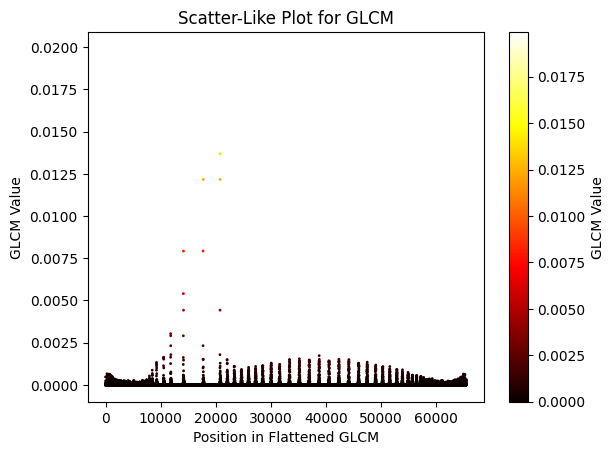

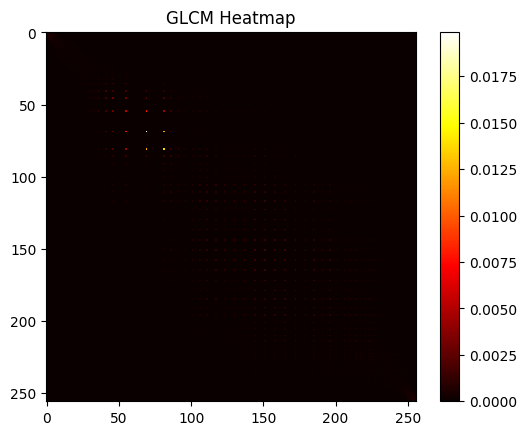

Processing: Mild_DR_58.png


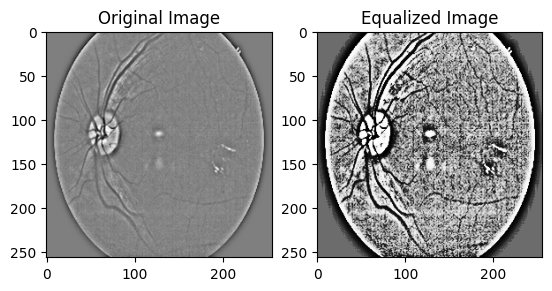

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[5.20833333e-04 5.22875817e-04 8.73161765e-04 6.61284121e-04]]

  [[3.75306373e-04 2.61437908e-04 3.90625000e-04 2.69127259e-04]]

  [[1.76164216e-04 1.46097655e-04 1.91482843e-04 1.15340254e-04]]

  ...

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 1.53787005e-05]]

  [[7.65931373e-06 9.22722030e-05 0.00000000e+00 6.92041522e-05]]

  [[0.00000000e+00 6.15148020e-05 0.00000000e+00 3.07574010e-05]]]


 [[[3.75306373e-04 2.61437908e-04 3.90625000e-04 2.69127259e-04]]

  [[3.67647059e-04 3.38331411e-04 1.53186275e-03 6.15148020e-04]]

  [[3.06372549e-04 2.15301807e-04 6.12745098e-04 3.61399462e-04]]

  ...

  [[7.65931373e-06 3.07574010e-05 7.65931373e-06 3.07574010e-05]]

  [[7.65931373e-06 6.15148020e-05 7.65931373e-06 7.68935025e-05]]

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 1.53787005e-05]]]


 [[[1.76164216e-04 1.46097655e-04 1.91482843e-04 1.15340254e-04]]

  [[3.06372549e-04 2.15301807e-04 6.12745098e-04 3.61399462e-04]]

  [[3.52328

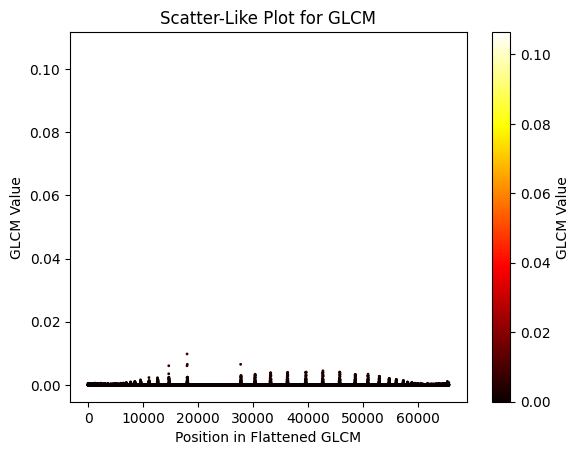

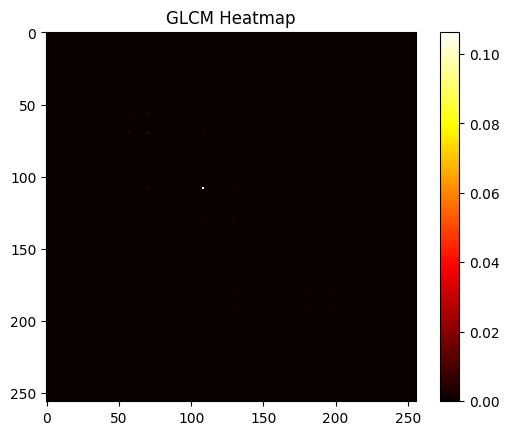

Processing: Mild_DR_63.png


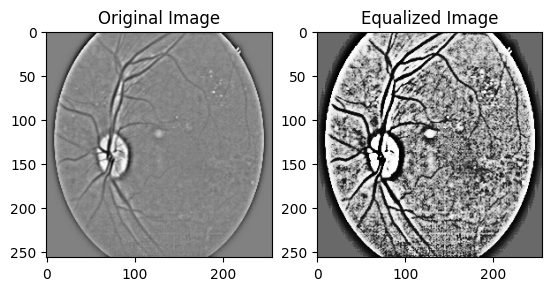

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[5.82107843e-04 4.92118416e-04 9.19117647e-04 8.91964629e-04]]

  [[4.90196078e-04 3.46020761e-04 4.44240196e-04 3.46020761e-04]]

  [[1.68504902e-04 1.84544406e-04 9.19117647e-05 1.38408304e-04]]

  ...

  [[7.65931373e-06 3.07574010e-05 0.00000000e+00 1.53787005e-05]]

  [[0.00000000e+00 6.15148020e-05 0.00000000e+00 3.84467512e-05]]

  [[0.00000000e+00 8.45828527e-05 0.00000000e+00 2.30680507e-05]]]


 [[[4.90196078e-04 3.46020761e-04 4.44240196e-04 3.46020761e-04]]

  [[5.20833333e-04 5.07497116e-04 1.91482843e-03 9.07343329e-04]]

  [[3.90625000e-04 3.07574010e-04 7.58272059e-04 3.61399462e-04]]

  ...

  [[7.65931373e-06 3.84467512e-05 7.65931373e-06 1.53787005e-05]]

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 2.30680507e-05]]

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 1.53787005e-05]]]


 [[[1.68504902e-04 1.84544406e-04 9.19117647e-05 1.38408304e-04]]

  [[3.90625000e-04 3.07574010e-04 7.58272059e-04 3.61399462e-04]]

  [[1.68504

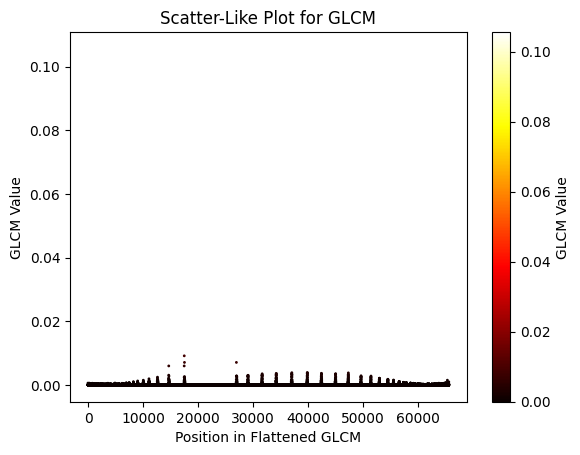

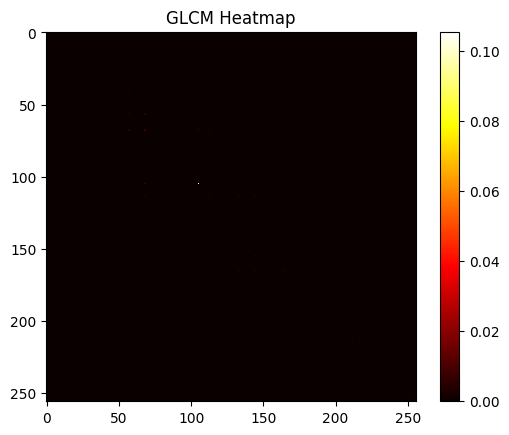

Processing: Mild_DR_339.png


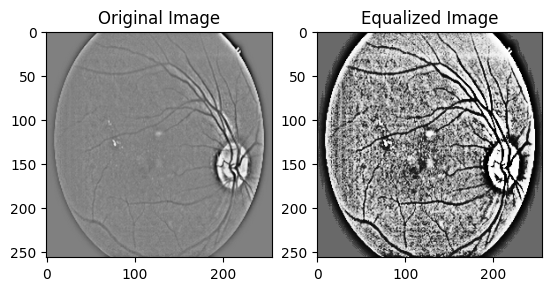

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[6.43382353e-04 8.61207228e-04 1.04166667e-03 2.61437908e-04]]

  [[4.90196078e-04 4.69050365e-04 5.43811275e-04 4.99807766e-04]]

  [[1.30208333e-04 1.61476355e-04 8.42524510e-05 1.99923106e-04]]

  ...

  [[1.53186275e-05 1.53787005e-05 7.65931373e-06 3.07574010e-05]]

  [[7.65931373e-06 0.00000000e+00 0.00000000e+00 3.84467512e-05]]

  [[0.00000000e+00 3.07574010e-05 0.00000000e+00 1.15340254e-04]]]


 [[[4.90196078e-04 4.69050365e-04 5.43811275e-04 4.99807766e-04]]

  [[8.11887255e-04 1.30718954e-03 1.82291667e-03 6.30526720e-04]]

  [[6.12745098e-04 5.53633218e-04 7.19975490e-04 4.22914264e-04]]

  ...

  [[2.29779412e-05 2.30680507e-05 0.00000000e+00 4.61361015e-05]]

  [[0.00000000e+00 1.53787005e-05 7.65931373e-06 1.53787005e-05]]

  [[7.65931373e-06 1.53787005e-05 0.00000000e+00 4.61361015e-05]]]


 [[[1.30208333e-04 1.61476355e-04 8.42524510e-05 1.99923106e-04]]

  [[6.12745098e-04 5.53633218e-04 7.19975490e-04 4.22914264e-04]]

  [[3.52328

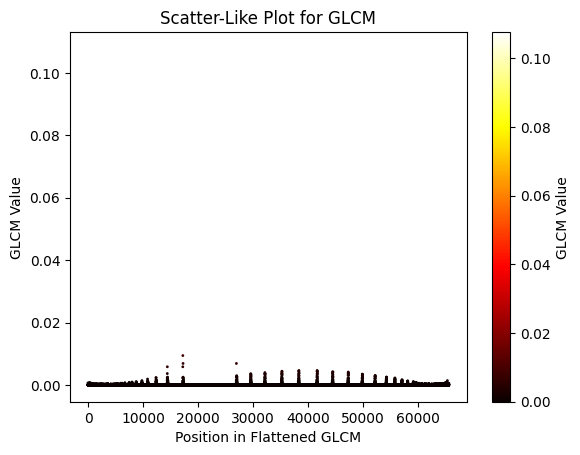

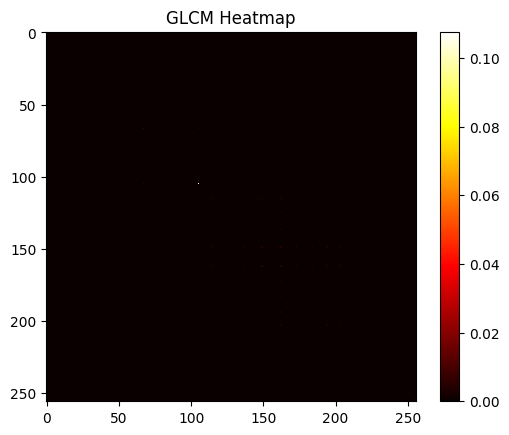

Processing: Mild_DR_42.png


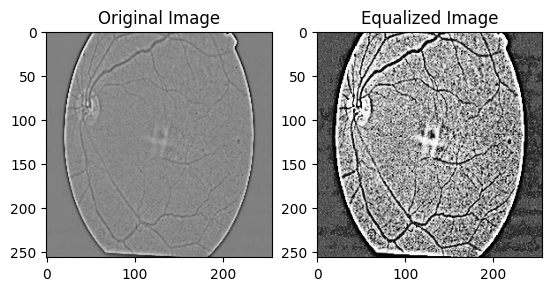

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[3.82965686e-04 9.22722030e-05 7.81250000e-04 1.84544406e-04]]

  [[1.37867647e-04 1.30718954e-04 4.05943627e-04 2.46059208e-04]]

  [[1.91482843e-04 1.30718954e-04 2.14460784e-04 1.76855056e-04]]

  ...

  [[6.12745098e-05 6.15148020e-05 7.65931373e-06 6.92041522e-05]]

  [[9.19117647e-05 1.23029604e-04 1.53186275e-05 7.68935025e-05]]

  [[1.53186275e-05 7.68935025e-05 0.00000000e+00 3.07574010e-05]]]


 [[[1.37867647e-04 1.30718954e-04 4.05943627e-04 2.46059208e-04]]

  [[7.81250000e-04 1.99923106e-04 1.53186275e-03 2.92195309e-04]]

  [[2.91053922e-04 3.30642061e-04 5.74448529e-04 2.61437908e-04]]

  ...

  [[1.07230392e-04 1.15340254e-04 7.65931373e-06 9.99615532e-05]]

  [[9.95710784e-05 1.53787005e-04 2.29779412e-05 9.22722030e-05]]

  [[6.12745098e-05 1.23029604e-04 0.00000000e+00 5.38254517e-05]]]


 [[[1.91482843e-04 1.30718954e-04 2.14460784e-04 1.76855056e-04]]

  [[2.91053922e-04 3.30642061e-04 5.74448529e-04 2.61437908e-04]]

  [[4.90196

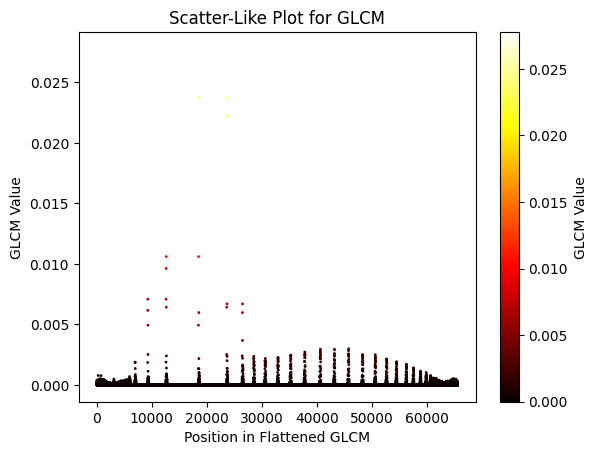

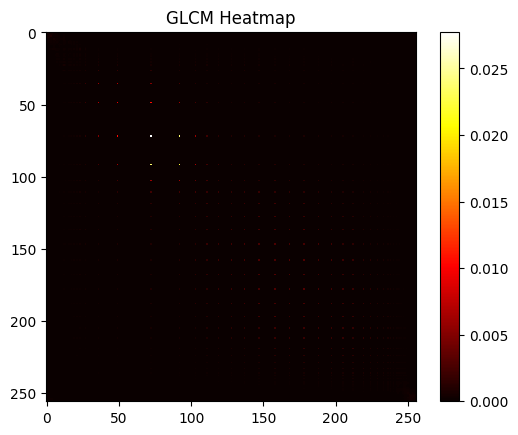

Processing: Mild_DR_89.png


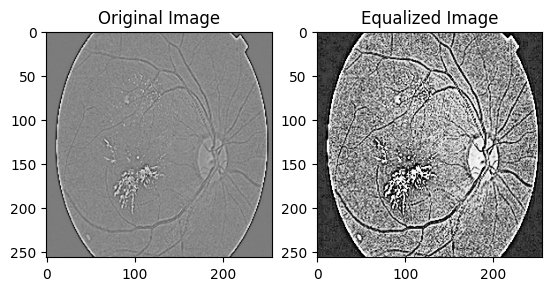

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[0.00000000e+00 3.07574010e-05 4.59558824e-04 7.68935025e-05]]

  [[6.12745098e-05 8.45828527e-05 5.13174020e-04 1.30718954e-04]]

  [[1.76164216e-04 2.07612457e-04 3.75306373e-04 2.15301807e-04]]

  ...

  [[8.42524510e-05 1.76855056e-04 7.65931373e-06 1.46097655e-04]]

  [[3.06372549e-05 5.38254517e-05 0.00000000e+00 5.38254517e-05]]

  [[5.36151961e-05 0.00000000e+00 0.00000000e+00 1.53787005e-05]]]


 [[[6.12745098e-05 8.45828527e-05 5.13174020e-04 1.30718954e-04]]

  [[2.75735294e-04 2.92195309e-04 1.59313725e-03 3.53710111e-04]]

  [[3.90625000e-04 3.61399462e-04 7.12316176e-04 4.61361015e-04]]

  ...

  [[1.60845588e-04 1.92233756e-04 4.59558824e-05 1.84544406e-04]]

  [[1.68504902e-04 2.46059208e-04 3.82965686e-05 1.61476355e-04]]

  [[4.59558824e-05 1.07650903e-04 0.00000000e+00 6.92041522e-05]]]


 [[[1.76164216e-04 2.07612457e-04 3.75306373e-04 2.15301807e-04]]

  [[3.90625000e-04 3.61399462e-04 7.12316176e-04 4.61361015e-04]]

  [[3.67647

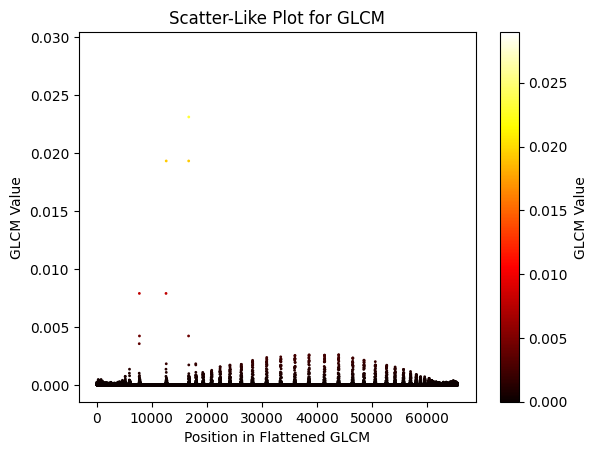

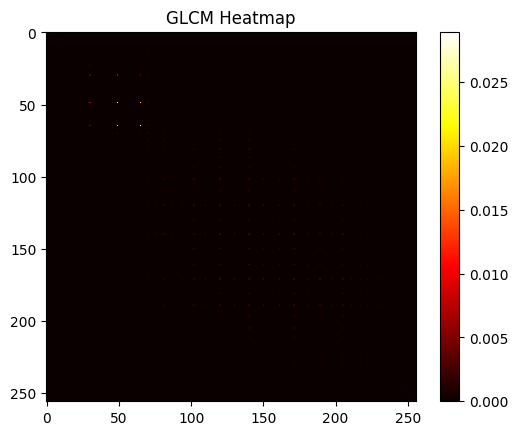

Processing: Mild_DR_317.png


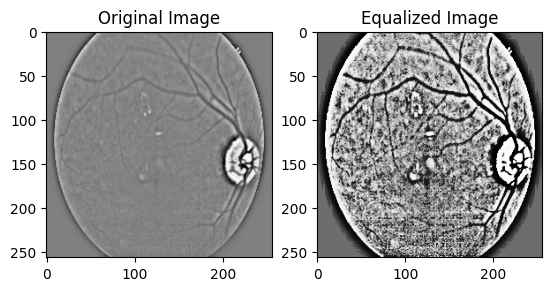

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[8.57843137e-04 6.92041522e-04 1.11825980e-03 7.22798923e-04]]

  [[5.20833333e-04 5.07497116e-04 4.59558824e-04 5.76701269e-04]]

  [[1.83823529e-04 1.46097655e-04 9.95710784e-05 1.61476355e-04]]

  ...

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]]


 [[[5.20833333e-04 5.07497116e-04 4.59558824e-04 5.76701269e-04]]

  [[1.05698529e-03 9.84236832e-04 1.82291667e-03 1.10726644e-03]]

  [[5.66789216e-04 5.22875817e-04 6.58700980e-04 5.15186467e-04]]

  ...

  [[7.65931373e-06 1.07650903e-04 0.00000000e+00 5.38254517e-05]]

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]]


 [[[1.83823529e-04 1.46097655e-04 9.95710784e-05 1.61476355e-04]]

  [[5.66789216e-04 5.22875817e-04 6.58700980e-04 5.15186467e-04]]

  [[3.21691

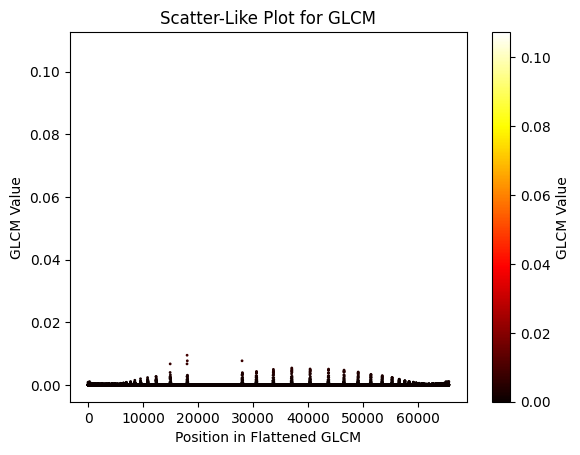

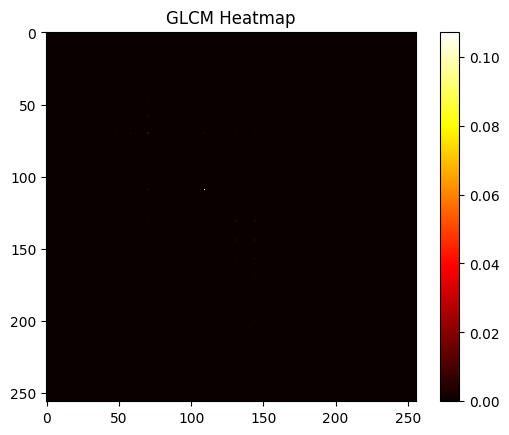

Processing: Mild_DR_338.png


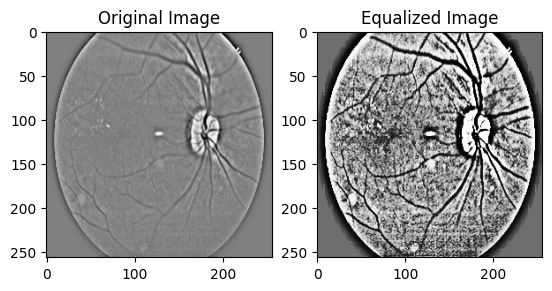

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[7.50612745e-04 9.38100730e-04 1.07230392e-03 4.76739715e-04]]

  [[3.98284314e-04 3.61399462e-04 4.59558824e-04 3.84467512e-04]]

  [[1.30208333e-04 1.38408304e-04 7.65931373e-05 1.61476355e-04]]

  ...

  [[1.53186275e-05 0.00000000e+00 0.00000000e+00 2.30680507e-05]]

  [[7.65931373e-06 7.68935025e-06 0.00000000e+00 3.84467512e-05]]

  [[0.00000000e+00 2.30680507e-05 0.00000000e+00 8.45828527e-05]]]


 [[[3.98284314e-04 3.61399462e-04 4.59558824e-04 3.84467512e-04]]

  [[7.19975490e-04 1.10726644e-03 1.43995098e-03 5.84390619e-04]]

  [[5.05514706e-04 4.99807766e-04 7.88909314e-04 3.69088812e-04]]

  ...

  [[0.00000000e+00 6.92041522e-05 7.65931373e-06 2.30680507e-05]]

  [[0.00000000e+00 3.84467512e-05 7.65931373e-06 2.30680507e-05]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 7.68935025e-06]]]


 [[[1.30208333e-04 1.38408304e-04 7.65931373e-05 1.61476355e-04]]

  [[5.05514706e-04 4.99807766e-04 7.88909314e-04 3.69088812e-04]]

  [[3.82965

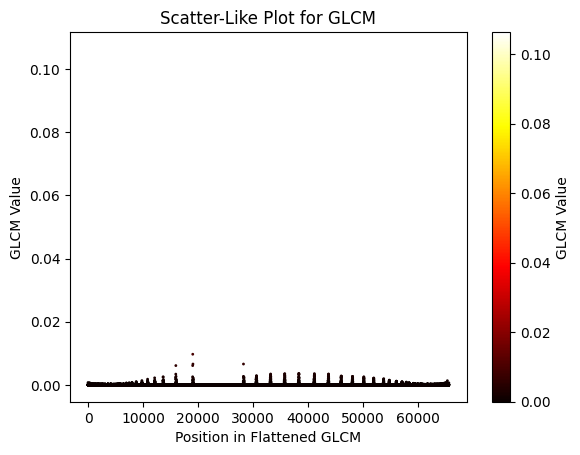

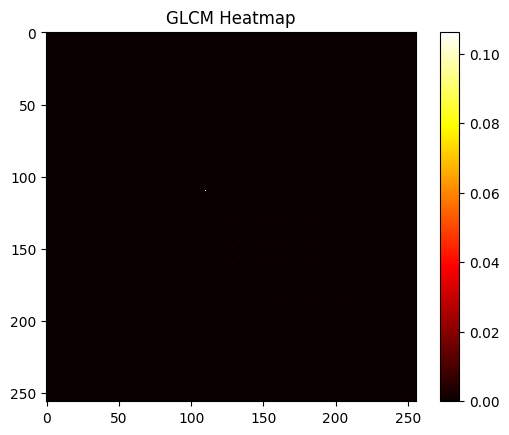

Processing: Mild_DR_310.png


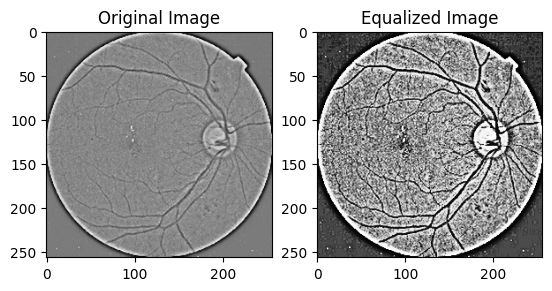

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

Gray-Level Co-Occurrence Matrix:
[[[[4.90196078e-04 7.68935025e-05 3.21691176e-04 1.53787005e-05]]

  [[3.14031863e-04 1.15340254e-04 2.68075980e-04 6.15148020e-05]]

  [[8.42524510e-05 1.46097655e-04 9.95710784e-05 6.92041522e-05]]

  ...

  [[7.65931373e-06 2.30680507e-05 0.00000000e+00 3.07574010e-05]]

  [[0.00000000e+00 7.68935025e-06 0.00000000e+00 3.84467512e-05]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 3.07574010e-05]]]


 [[[3.14031863e-04 1.15340254e-04 2.68075980e-04 6.15148020e-05]]

  [[4.13602941e-04 4.30603614e-04 7.35294118e-04 3.22952710e-04]]

  [[5.20833333e-04 3.07574010e-04 5.51470588e-04 3.84467512e-04]]

  ...

  [[1.53186275e-05 9.22722030e-05 1.53186275e-05 6.92041522e-05]]

  [[0.00000000e+00 7.68935025e-05 0.00000000e+00 4.61361015e-05]]

  [[7.65931373e-06 4.61361015e-05 0.00000000e+00 6.15148020e-05]]]


 [[[8.42524510e-05 1.46097655e-04 9.95710784e-05 6.92041522e-05]]

  [[5.20833333e-04 3.07574010e-04 5.51470588e-04 3.84467512e-04]]

  [[4.44240

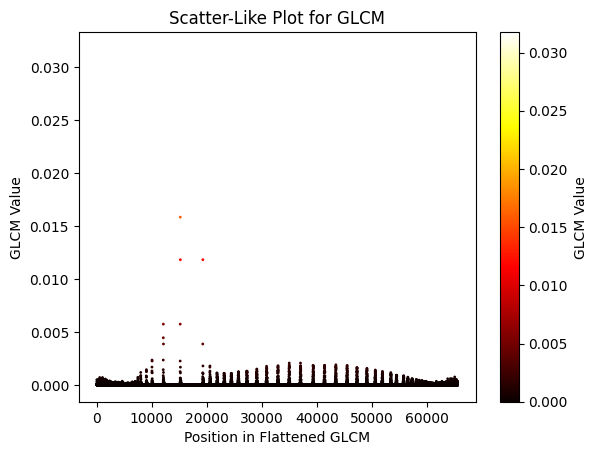

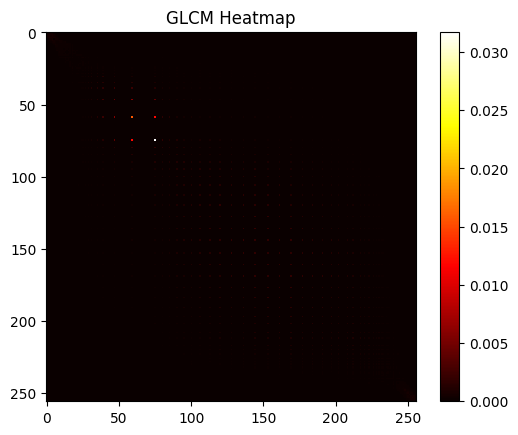

In [ ]:
import os
folder_path = '/content/drive/MyDrive/GLCM RD-sadhu/Mild DR_1'
os.chdir(folder_path)

# Iterate through all files
for file_name in os.listdir():
    file_path = os.path.join(folder_path, file_name)
    if os.path.isfile(file_path):
        print("Processing:", file_name)
        img=equ(file_name)
        mat=matrix(img)
        scatter(mat)
        heatmap(mat)


MODERATE DR:

In [ ]:
import os
folder_path = '/content/drive/MyDrive/GLCM RD-sadhu/Moderate DR_1'
os.chdir(folder_path)

# Iterate through all files
for file_name in os.listdir():
    file_path = os.path.join(folder_path, file_name)
    if os.path.isfile(file_path):
        print("Processing:", file_name)
        img=equ(file_name)
        mat=matrix(img)
        scatter(mat)
        heatmap(mat)


PROLIFERATE DR:

In [ ]:
import os
folder_path = '/content/drive/MyDrive/GLCM RD-sadhu/Proliferate DR_1'
os.chdir(folder_path)

# Iterate through all files
for file_name in os.listdir():
    file_path = os.path.join(folder_path, file_name)
    if os.path.isfile(file_path):
        print("Processing:", file_name)
        img=equ(file_name)
        mat=matrix(img)
        scatter(mat)
        heatmap(mat)


SEVERE DR:

In [ ]:
import os
folder_path = '/content/drive/MyDrive/GLCM RD-sadhu/Severe DR_1'
os.chdir(folder_path)

# Iterate through all files
for file_name in os.listdir():
    file_path = os.path.join(folder_path, file_name)
    if os.path.isfile(file_path):
        print("Processing:", file_name)
        img=equ(file_name)
        mat=matrix(img)
        scatter(mat)
        heatmap(mat)
